In [1]:
import numpy as np
from astropy.table import Table, Column, join
from numpy import random
import scipy.stats as stats
import matplotlib.pyplot as plt
import astropy.coordinates as coords
import astropy.units as u

In [2]:
filename = 'fullcrossmatchAgesCDGS.fits'

b = Table.read(filename)

b.info

<Table length=41652>
  name   dtype  shape unit n_bad
------- ------- ----- ---- -----
     ID bytes18                0
   DIST float64        kpc     0
    DLO float64        kpc     0
    DHI float64        kpc     0
     RA float64        deg     0
    DEC float64        deg     0
    RAD float64                0
 CYLRAD float64                0
     GX float64        kpc     0
     GY float64        kpc     0
     GZ float64        kpc     0
   TEMP float32                0
TEMPERR float32                0
   LOGG float32                0
LOGGERR float32                0
     MH float32                0
  MHERR float32                0
     AM float32                0
  AMERR float32                0
    X_H float32 (26,)          0
X_H_ERR float32 (26,)          0
    X_M float32 (26,)          0
X_M_ERR float32 (26,)          0
   C_FE float32                0
  CI_FE float32                0
   N_FE float32                0
   O_FE float32                0
  NA_FE float32       

In [ ]:
##fix AGE to get rid of those nan values!!!

In [3]:

ID = b['ID']

DIST = b['DIST']
DLO = b['DLO']
DHI = b['DHI']

RA = b['RA']
DEC = b['DEC']

RAD = b['RAD']
CYLRAD = b['CYLRAD']
GX = b['GX']
GY = b['GY']
HEIGHT = b['GZ']

TEFF = b['TEMP']
TEFFERR = b['TEMPERR']
LOGG = b['LOGG']
LOGGERR = b['LOGGERR']
MH = b['MH']
MHERR = b['MHERR']
AM = b['AM']
AMERR = b['AMERR']
X_H = b['X_H']
X_H_ERR = b['X_H_ERR']
X_M = b['X_M']
X_M_ERR = b['X_M_ERR']
C_FE = b['C_FE']
CI_FE = b['CI_FE']
N_FE = b['N_FE']
O_FE = b['O_FE']
NA_FE = b['NA_FE']
MG_FE = b['MG_FE']
AL_FE = b['AL_FE']
SI_FE = b['SI_FE']
P_FE = b['P_FE']
S_FE = b['S_FE']
K_FE = b['K_FE']
CA_FE = b['CA_FE']
TI_FE = b['TI_FE']
TIII_FE = b['TIII_FE']
V_FE = b['V_FE']
CR_FE = b['CR_FE']
MN_FE = b['MN_FE']
FE_H = b['FE_H']
CO_FE = b['CO_FE']
NI_FE = b['NI_FE']
CU_FE = b['CU_FE']
GE_FE = b['GE_FE']
RB_FE = b['RB_FE']
Y_FE = b['Y_FE']
ND_FE = b['ND_FE']

AGE = b['AGE']

In [ ]:

##plots of alpha ratio by bin colored by age - check for old stars in outer radii for high and low alpha...check by
##height as well

##Disbursion plot?  Check out Hayden paper...

In [4]:
xval = np.arange(-1, 1, 0.05)
m = -0.05
c = 0.08
yval = m*xval + c
avg = np.mean(yval)
minRadius = np.arange(0, 15, 2)
maxRadius = np.arange(2, 17, 2)
minZheights = [0.0, 0.5, 1.0]
maxZheights = [0.5, 1.0, 2.0]
print(avg)

0.08124999999999996


In [5]:
##Redo the alpha plots, and bring in the error analysis function to create new distances - or use the csv file

def create_new_distance(rows, n, distance, lowsigma, hisigma, nval = 1000):
    new_distance_bin = np.zeros(shape=(rows,n))
    for i, (mymean, myclipa, myclipb) in enumerate(zip(distance, lowsigma, hisigma)):
        STD1 = myclipb-myclipa
        a = (myclipa - mymean)/STD1
        b = (myclipb - mymean)/STD1
        mean, var, skew, kurt = stats.truncnorm.stats(a, b, moments='mvsk')
        for j in range(0,n):            
            X = stats.truncnorm(a, b, loc=mymean, scale=STD1)            
            new_dist = X.rvs(nval)[random.randint(nval)]
            new_distance_bin[i,j] = new_dist
    return new_distance_bin

In [9]:
rows = len(DIST)
n = 1000

radius = np.zeros((rows, n))
cr = np.zeros((rows, n))
height = np.zeros((rows, n))

distance_bin = create_new_distance(rows, n, DIST, DLO, DHI)


In [10]:

for i in range(n):
    GC = coords.SkyCoord(RA, DEC, distance_bin[:,i]*u.kpc)
    GCGAL = GC.transform_to(coords.Galactocentric)
    GX = GCGAL.x
    GY = GCGAL.y
    GZ = GCGAL.z

    radius[:, i] = ((GX**2 + GY**2 + GZ**2)**0.5)/u.kpc
    cr[:, i] = ((GX**2 + GY**2)**0.5)/u.kpc
    height[:, i] = GZ/u.kpc

In [11]:
radius[5000]

array([12.33215637, 12.47955281, 13.08662243, 12.80311961, 12.77942228,
       11.98615047, 12.44764581, 13.241801  , 12.13482636, 12.70876816,
       12.39527894, 12.37481135, 12.98788693, 13.10599915, 12.69111989,
       12.39349875, 12.7967345 , 13.1718279 , 12.6090253 , 13.06552155,
       11.94376825, 13.17007917, 11.97791138, 12.06947494, 12.91703483,
       12.57228288, 12.17525191, 12.60928616, 12.10310853, 12.07653503,
       12.27041654, 12.15533654, 12.48994834, 12.08508595, 12.0103951 ,
       13.30716765, 12.32463145, 13.35007157, 13.25945718, 12.47443628,
       12.77918185, 12.89913676, 12.25594783, 12.44537286, 12.32644161,
       12.91850765, 13.08044024, 13.01762371, 12.53597481, 12.37839601,
       12.22111396, 12.63067091, 12.51996318, 12.00490592, 12.22846486,
       12.61927026, 12.62055959, 12.13660481, 12.62134069, 12.21560364,
       12.09618241, 13.03324418, 12.90478153, 12.19211505, 12.085311  ,
       12.51104369, 13.27052434, 12.19449457, 13.28653452, 12.04

0 2
The mean and std is:  9.776511011211012 4.393985640423276
2 4
The mean and std is:  4.971395473494303 0.7244154035802616
4 6
The mean and std is:  1.4849397913393072 0.037798828474526404
6 8
The mean and std is:  0.9055323216906289 0.0047851614438215355
8 10
The mean and std is:  0.2717700203132348 0.0010411053361855677
10 12
The mean and std is:  0.14853652724734345 0.0013338750908309562
12 14
The mean and std is:  0.15573128603902267 0.003191640796658314
14 16
The mean and std is:  0.1467611235529432 0.009698923450992863
[ 0.00892897 -0.28457685  1.36518981]


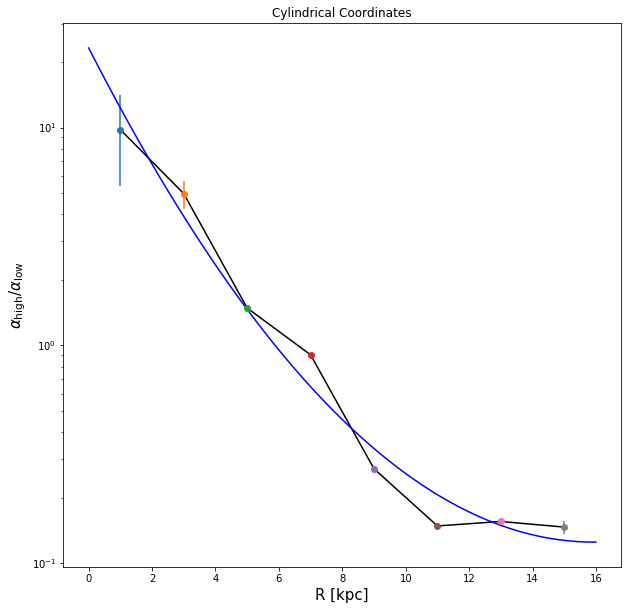

In [13]:
mean_ratio_alpha = []
std_ratio_alpha = []

plt.figure(figsize=(10,10))
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    ratio_alpha = np.zeros(n)
    for i, mcn in enumerate(np.arange(n)):
        if i == 0: print(minr, maxr)
        index_cr = np.logical_and( cr[:,mcn] > minr, cr[:,mcn] <= maxr)
        high_alpha_index = (AM > avg) & index_cr
        low_alpha_index = (AM <= avg) & index_cr

        nlow_alpha = np.sum(low_alpha_index)
        nhigh_alpha = np.sum(high_alpha_index)
        ratio_alpha[i] = float(nhigh_alpha)/nlow_alpha
        
    print('The mean and std is: ',np.mean(ratio_alpha), np.std(ratio_alpha))
    mean_ratio_alpha.append(np.mean(ratio_alpha))
    std_ratio_alpha.append(np.std(ratio_alpha))
    plt.errorbar(0.5*(minr + maxr), np.mean(ratio_alpha), yerr=np.std(ratio_alpha), fmt='o')
plt.plot(0.5*(minRadius + maxRadius), mean_ratio_alpha, c='k')
coeff = np.polyfit(0.5*(minRadius + maxRadius), np.log10(mean_ratio_alpha), 2)
print(coeff)
p = np.poly1d(coeff)
x = np.linspace(0, 16, 100)
plt.plot(x, 10**p(x), c='b')
plt.yscale('log')
plt.xlabel('R [kpc]', fontsize=15)
plt.ylabel(r'$\alpha_{\mathrm{high}}/\alpha_{\mathrm{low}}$', fontsize=15)
plt.title('Cylindrical Coordinates')
plt.savefig('AlphaHLCYL1000Final.png')

0 2


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:112: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


The mean and std is:  inf nan
2 4
The mean and std is:  4.013051625215041 0.5980422566038356
4 6
The mean and std is:  1.3424789418436875 0.036321468479775354
6 8
The mean and std is:  0.8026232073586215 0.004578297368136364
8 10
The mean and std is:  0.3046849251777501 0.0011012464444526426
10 12
The mean and std is:  0.15547089868553382 0.0013275672527145925
12 14
The mean and std is:  0.16064487105944558 0.0031550667252138558
14 16
The mean and std is:  0.1496393130332334 0.00967341299398937
[nan nan nan]


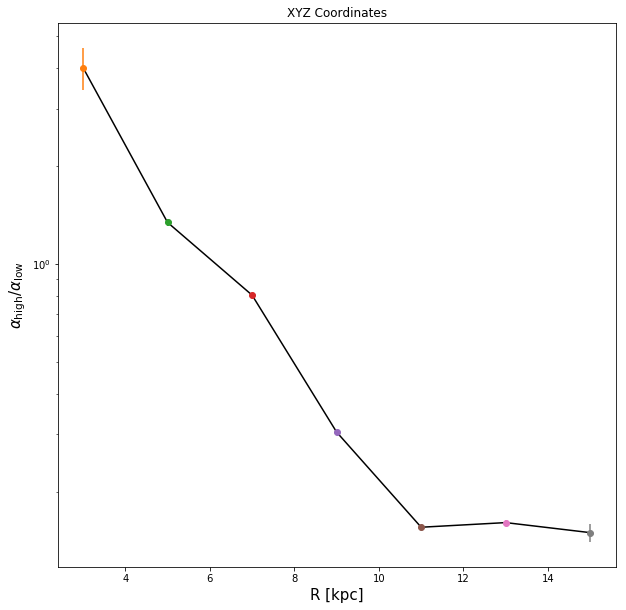

In [22]:
mean_xyzratio_alpha = []
std_xyzratio_alpha = []

plt.figure(figsize=(10,10))
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    ratio_alpha = np.zeros(n)
    for i, mcn in enumerate(np.arange(n)):
        if i == 0: print(minr, maxr)
        index_xyzr = np.logical_and( radius[:,mcn] > minr, radius[:,mcn] <= maxr)
        high_alpha_index = (AM > avg) & index_xyzr
        low_alpha_index = (AM <= avg) & index_xyzr

        nlow_alpha = np.sum(low_alpha_index)
        nhigh_alpha = np.sum(high_alpha_index)
        ratio_alpha[i] = float(nhigh_alpha)/nlow_alpha
        
    print('The mean and std is: ',np.mean(ratio_alpha), np.std(ratio_alpha))
    mean_xyzratio_alpha.append(np.mean(ratio_alpha))
    std_xyzratio_alpha.append(np.std(ratio_alpha))
    plt.errorbar(0.5*(minr + maxr), np.mean(ratio_alpha), yerr=np.std(ratio_alpha), fmt='o')
plt.plot(0.5*(minRadius + maxRadius), mean_xyzratio_alpha, c='k')
coeff = np.polyfit(0.5*(minRadius + maxRadius), np.log10(mean_xyzratio_alpha), 2)
print(coeff)
p = np.poly1d(coeff)
x = np.linspace(0, 16, 100)
plt.plot(x, 10**p(x), c='b')
plt.yscale('log')
plt.xlabel('R [kpc]', fontsize=15)
plt.ylabel(r'$\alpha_{\mathrm{high}}/\alpha_{\mathrm{low}}$', fontsize=15)
plt.title('XYZ Coordinates')
plt.savefig('AlphaHLXYZ1000Final.png', overwrite=True)

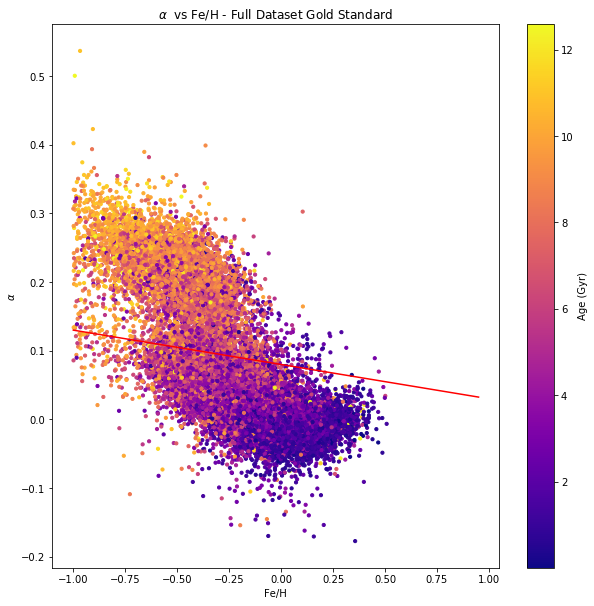

In [36]:
plt.figure(figsize=(10,10))
ax1 = plt.subplot(111)
P1 = ax1.scatter(FE_H, AM, s=10, c=((10**AGE)), cmap='plasma')
L = plt.plot(xval, yval, zorder=1, c='r')
plt.colorbar(P1, label ="Age (Gyr)")
plt.title(r'$\alpha$ '+' vs Fe/H - Full Dataset Gold Standard')
plt.xlabel('Fe/H')
plt.ylabel(r'$\alpha$')
plt.savefig('FullCDGS_AlphavsFe_Ages.png', overwrite=True)

Text(0,0.5,'Galactic Y (kpc)')

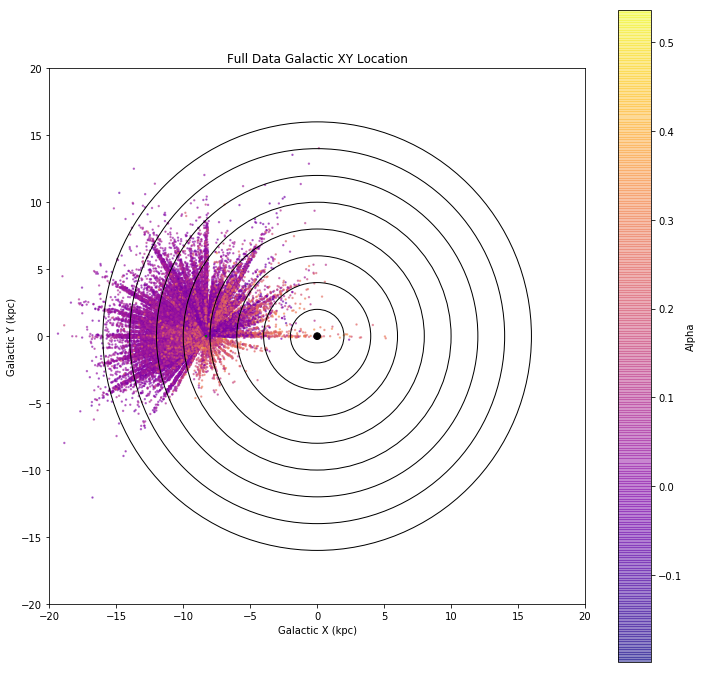

In [42]:

fig,ax = plt.subplots(1, figsize=(12,12))
plt.title('Full Data Galactic XY Location')
ax.set_aspect('equal')
Earth = plt.Circle((-8.3,0), 0.05, color='g')
GalacticCenter = plt.Circle((0,0), 0.25, color='k')

C1 = plt.Circle((0,0), 2, fill=False, edgecolor='k')
C2 = plt.Circle((0,0), 4, fill=False, edgecolor='k')
C3 = plt.Circle((0,0), 6, fill=False, edgecolor='k')
C4 = plt.Circle((0,0), 8, fill=False, edgecolor='k')
C5 = plt.Circle((0,0), 10, fill=False, edgecolor='k')
C6 = plt.Circle((0,0), 12, fill=False, edgecolor='k')
C7 = plt.Circle((0,0), 14, fill=False, edgecolor='k')
C8 = plt.Circle((0,0), 16, fill=False, edgecolor='k')

ax.set_xlim((-20,20))
ax.set_ylim((-20,20))
ax.add_artist(Earth)
ax.add_artist(GalacticCenter)
ax.add_artist(C1)
ax.add_artist(C2)
ax.add_artist(C3)
ax.add_artist(C4)
ax.add_artist(C5)
ax.add_artist(C6)
ax.add_artist(C7)
ax.add_artist(C8)

RS1 = ax.scatter(GX, GY, s=2, alpha=0.5, c=AM, cmap='plasma')
plt.colorbar(RS1, label ="Alpha")

plt.xlabel('Galactic X (kpc)')
plt.ylabel('Galactic Y (kpc)')
##plt.savefig('ScatterFullDataCDAges.png')

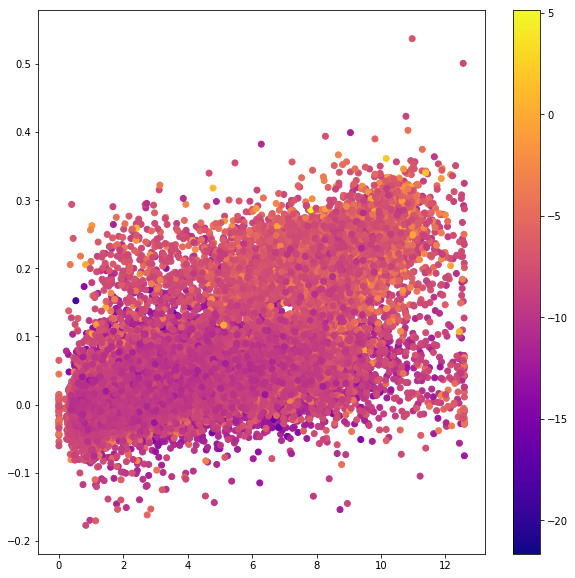

In [48]:
fig, ax = plt.subplots(1, figsize=(10,10))
AVA = plt.scatter((10**AGE), AM, c=GX, cmap='plasma')
plt.colorbar(AVA)

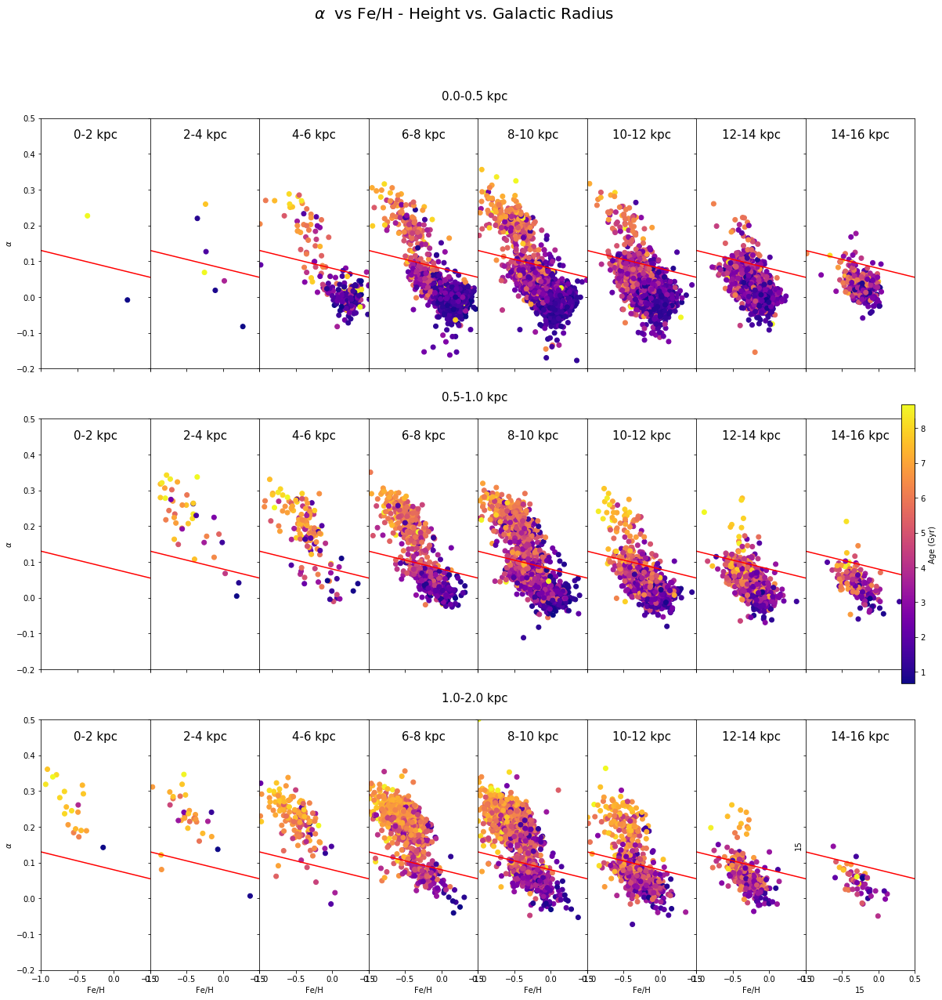

In [41]:
fig, ax = plt.subplots(3, 8, sharex='col', sharey='row', figsize=(20,20))
fig.suptitle(r'$\alpha$ '+' vs Fe/H - Height vs. Galactic Radius', fontsize=20)


for i in range(8):
    bcut = np.logical_and(RAD > minRadius[i], RAD <= maxRadius[i])
    for j in range(3):
        height = np.logical_and(HEIGHT > minZheights[j], HEIGHT <= maxZheights[j])
        indices = np.logical_and(bcut, height)
        P = ax[j, i].scatter(FE_H[indices], AM[indices], c=10.**AGE[indices], cmap='plasma')
        ax[j, i].set_title('{0}-{1} kpc'.format(minRadius[i], maxRadius[i]), y=0.9, fontsize=15 )
        if i == 3: ax[j, i].annotate('{0}-{1} kpc'.format(minZheights[j], maxZheights[j]), xy=(0.0, 0.55), xycoords=ax[j,i].transData, fontsize=15)
        ax[j,i].set_xlim(-1, 0.5)
        ax[j,i].set_ylim(-0.2, 0.5)
        L = ax[j,i].plot(xval, yval, zorder=1, c='r')
fig.colorbar(P, label='Age (Gyr)', ax=ax[:,7])
fig.subplots_adjust(wspace=0)

for axs in ax.flat:
    axs.set(xlabel='Fe/H', ylabel=r'$\alpha$')
# Hide x labels and tick labels for top plots and y ticks for right plots.
for axs in ax.flat:
    axs.label_outer()
plt.xlabel(s=15)
plt.ylabel(s=15)
plt.savefig('FullCDGS_AlphavsFe_HeightvRadius.png', overwrite=True)

In [39]:
colorbar = (10**AGE)

/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2954: RuntimeWarning: Mean of empty slice.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:916: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/anaconda3/lib/python3.6

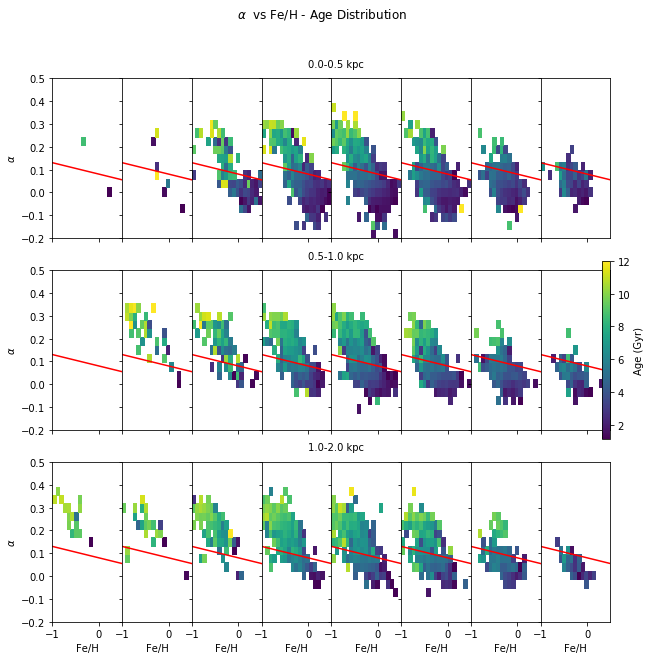

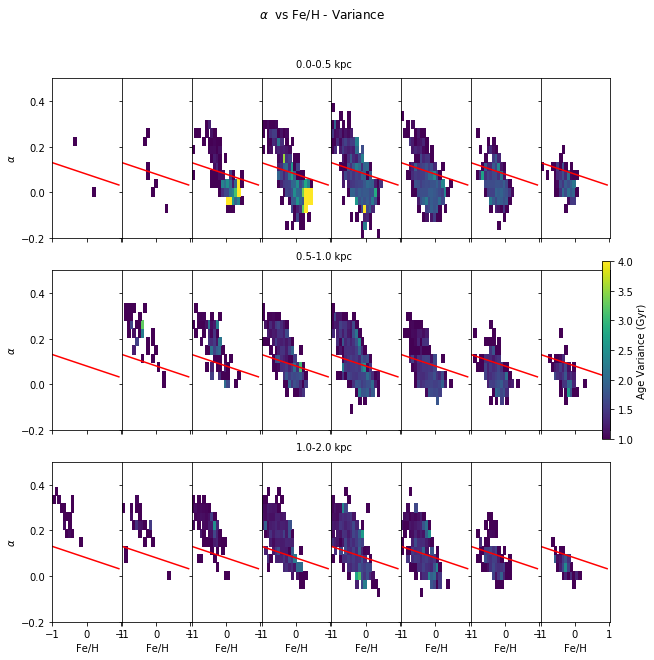

In [145]:
fig, ax = plt.subplots(3, 8, sharex='col', sharey='row', figsize=(10,10))
figdisp, axdisp = plt.subplots(3, 8, sharex='col', sharey='row', figsize=(10,10))
fig.suptitle(r'$\alpha$ '+' vs Fe/H - Age Distribution')
figdisp.suptitle(r'$\alpha$ '+' vs Fe/H - Variance')

nbins = 20
xbins = np.linspace(-1, 0.5, nbins)
ybins = np.linspace(-0.2, 0.5, nbins)
H, xe, ye = np.histogram2d(FE_H, AM, bins=(xbins, ybins))
HAge = np.zeros((nbins-1, nbins-1))
HDisp = np.zeros((nbins-1, nbins-1))


for i in range(8):
    bcut = np.logical_and(RAD > minRadius[i], RAD <= maxRadius[i])
    for j in range(3):
        height = np.logical_and(HEIGHT > minZheights[j], HEIGHT <= maxZheights[j])
        indices = np.logical_and(bcut, height)
        for xi in range(nbins-1):
            feind = np.logical_and(FE_H[indices] > xe[xi], FE_H[indices] <= xe[xi+1])
            for yj in range(nbins-1):
                alphaind = np.logical_and(AM[indices] > ye[yj], AM[indices] <= ye[yj+1])
                ind = np.logical_and(feind, alphaind)
                ##plt.hist(AGE[ind][~np.isnan(AGE[ind])], log=True, histtype='step', bins = 100)
                mean = np.mean(AGE[indices][ind][~np.isnan(AGE[indices][ind])])
                std = np.std(AGE[indices][ind][~np.isnan(AGE[indices][ind])])
                HAge[xi,yj] = mean
                HDisp[xi,yj] = std
        im = ax[j,i].pcolormesh(xe, ye, 10**HAge.T, vmax=12)
        im2 = axdisp[j,i].pcolormesh(xe, ye, 10**HDisp.T, vmax=4)
      ##norm=mpl.colors.LogNorm()
                    

        if i == 3: ax[j, i].annotate('{0}-{1} kpc'.format(minZheights[j], maxZheights[j]), xy=(0.0, 0.55), xycoords=ax[j,i].transData)
        if i == 3: axdisp[j, i].annotate('{0}-{1} kpc'.format(minZheights[j], maxZheights[j]), xy=(0.0, 0.55), xycoords=axdisp[j,i].transData)

        ax[j,i].set_xlim(-1, 0.5)
        ax[j,i].set_ylim(-0.2, 0.5)
        L = ax[j,i].plot(xval, yval, zorder=1, c='r')
        L = axdisp[j,i].plot(xval, yval, zorder=1, c='r')
fig.colorbar(im, label='Age (Gyr)', ax=ax[:,7])
fig.subplots_adjust(wspace=0)

figdisp.colorbar(im2, label='Age Variance (Gyr)', ax=axdisp[:,7])
figdisp.subplots_adjust(wspace=0)



for axs in ax.flat:
    axs.set(xlabel='Fe/H', ylabel=r'$\alpha$')
# Hide x labels and tick labels for top plots and y ticks for right plots.
for axs in ax.flat:
    axs.label_outer()

for axds in axdisp.flat:
    axds.set(xlabel='Fe/H', ylabel=r'$\alpha$')
# Hide x labels and tick labels for top plots and y ticks for right plots.
for axds in axdisp.flat:
    axds.label_outer()
    
##fig.savefig('FullCDGS_AlphavsFe_AgeDist.png')
figdisp.savefig('FullCDGS_AlphavsFe_AgeVariance.png', overwrite=True)

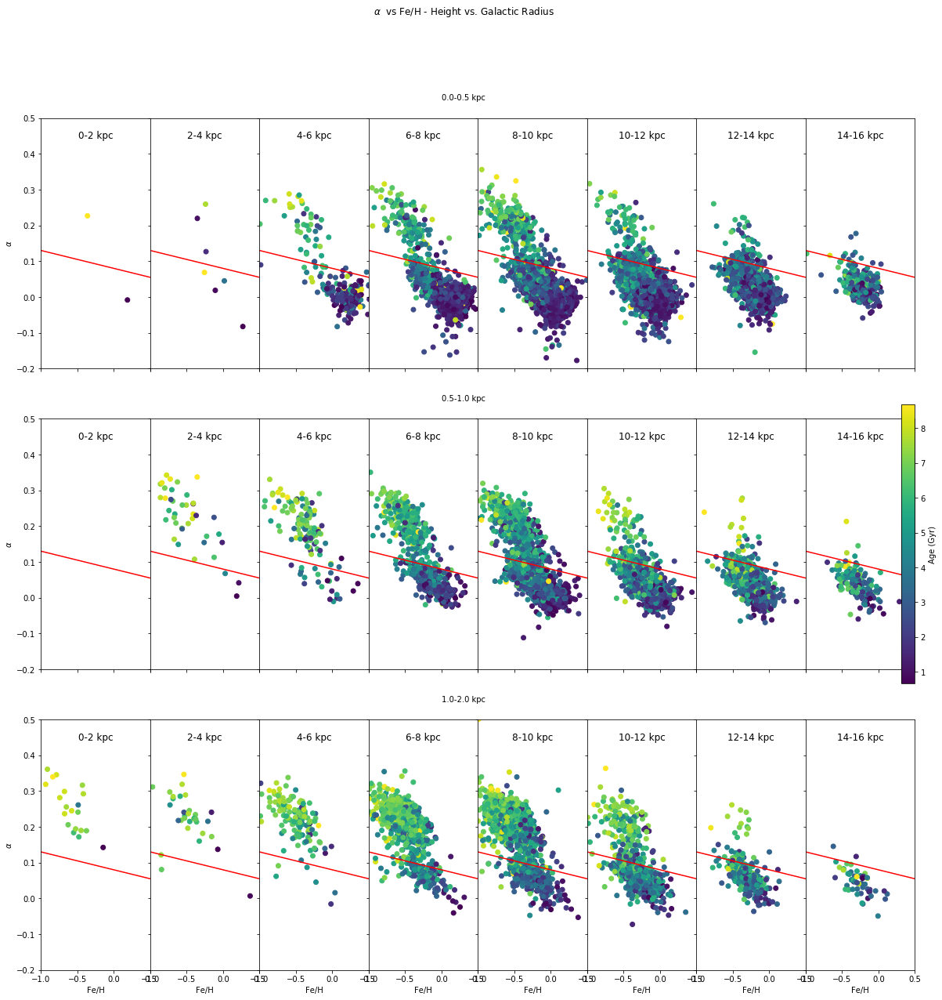

In [141]:
fig, ax = plt.subplots(3, 8, sharex='col', sharey='row', figsize=(20,20))
fig.suptitle(r'$\alpha$ '+' vs Fe/H - Height vs. Galactic Radius')


for i in range(8):
    bcut = np.logical_and(RAD > minRadius[i], RAD <= maxRadius[i])
    for j in range(3):
        height = np.logical_and(HEIGHT > minZheights[j], HEIGHT <= maxZheights[j])
        indices = np.logical_and(bcut, height)
        P = ax[j, i].scatter(FE_H[indices], AM[indices], c=10.**AGE[indices])
        ax[j, i].set_title('{0}-{1} kpc'.format(minRadius[i], maxRadius[i]), y=0.9 )
        if i == 3: ax[j, i].annotate('{0}-{1} kpc'.format(minZheights[j], maxZheights[j]), xy=(0.0, 0.55), xycoords=ax[j,i].transData)
        ax[j,i].set_xlim(-1, 0.5)
        ax[j,i].set_ylim(-0.2, 0.5)
        L = ax[j,i].plot(xval, yval, zorder=1, c='r')
fig.colorbar(P, label='Age (Gyr)', ax=ax[:,7])
fig.subplots_adjust(wspace=0)

for axs in ax.flat:
    axs.set(xlabel='Fe/H', ylabel=r'$\alpha$')
# Hide x labels and tick labels for top plots and y ticks for right plots.
for axs in ax.flat:
    axs.label_outer()

plt.savefig('FullCDGS_AlphavsFe_HeightvRadius.png')

In [60]:
import matplotlib as mpl 

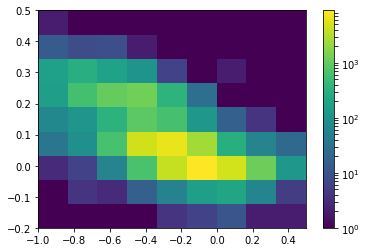

In [122]:
##more bins = higher resolution
##full density of stars - each pixel value represents the number of stars in the pixel

nbins = 10
xbins = np.linspace(-1, 0.5, nbins)
ybins = np.linspace(-0.2, 0.5, nbins)
H, xe, ye = np.histogram2d(FE_H, AM, bins=(xbins, ybins))
im = plt.pcolormesh(xe, ye, H.T + 1,
      norm=mpl.colors.LogNorm())
plt.colorbar(im)

In [103]:
H

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [125]:
feind = np.digitize(FE_H, xbins)

In [126]:
alphaind = np.digitize(AM, ybins)

In [104]:
HAge = np.zeros((nbins-1, nbins-1))
HDisp = np.zeros((nbins-1, nbins-1))

for i in range(nbins-1):
    feind = np.logical_and(FE_H > xe[i], FE_H <= xe[i+1])
    for j in range(nbins-1):
        alphaind = np.logical_and(AM > ye[j], AM <= ye[j+1])
        ind = np.logical_and(feind, alphaind)
        ##plt.hist(AGE[ind][~np.isnan(AGE[ind])], log=True, histtype='step', bins = 100)
        mean = np.mean(AGE[ind][~np.isnan(AGE[ind])])
        std = np.std(AGE[ind][~np.isnan(AGE[ind])])
        HAge[i,j] = mean
        HDisp[i,j] = std

/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2954: RuntimeWarning: Mean of empty slice.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


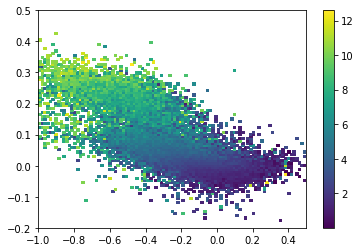

In [107]:
im = plt.pcolormesh(xe, ye, 10**HAge.T ,
      ##norm=mpl.colors.LogNorm()
                   )
plt.colorbar(im)

##This plot each pixel value is showing the average age of the stars in that pixel

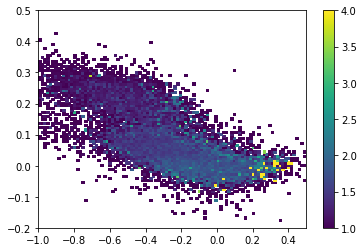

In [121]:
im2 = plt.pcolormesh(xe, ye, 10**HDisp.T, vmax=4)
      ##norm=mpl.colors.LogNorm())
plt.colorbar(im2)

##In this plot each pixel value represents the std/variance of the ages of all the stars in the pixel (width of distribution)

In [ ]:
##use imshow(matrix, interpolation=nearest, (xmin, xmax - Fe/H), (ymin, ymax - alpha))
##some hist2d - one for mean age, one for dispersion age
##mono-abundance to show dispersion
##p color mesh

Text(0,0.5,'$\\alpha$')

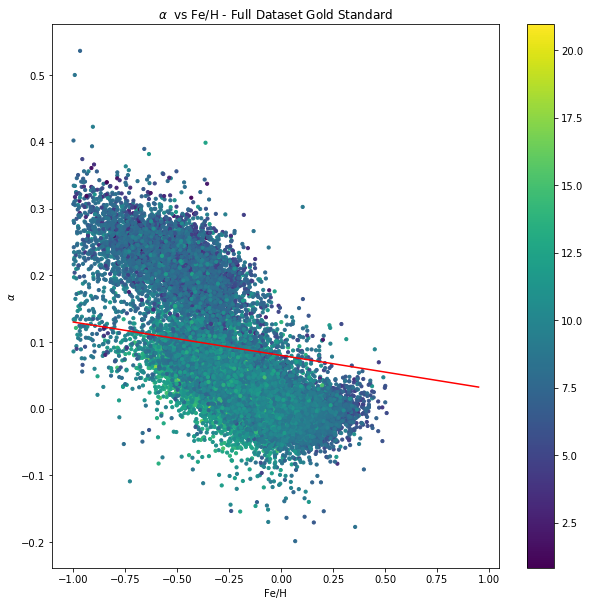

In [31]:
plt.figure(figsize=(10,10))
ax1 = plt.subplot(111)
P1 = ax1.scatter(FE_H, AM, s=10, c=RAD)
L = plt.plot(xval, yval, zorder=1, c='r')
plt.colorbar(P1)
plt.title(r'$\alpha$ '+' vs Fe/H - Full Dataset Gold Standard')
plt.xlabel('Fe/H')
plt.ylabel(r'$\alpha$')

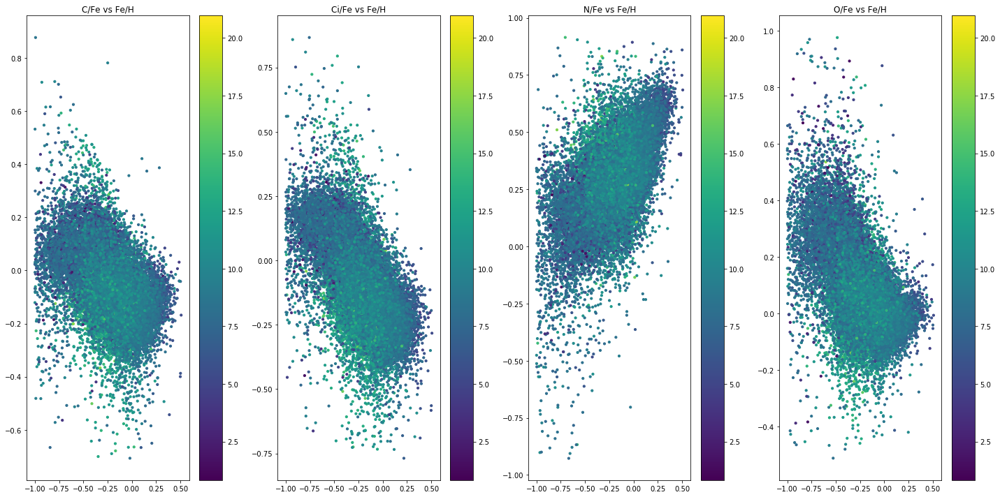

In [32]:
ccut = (np.abs(C_FE) < 1.)
cicut = (np.abs(CI_FE) < 1.)
ncut = (np.abs(N_FE) < 1.)
ocut = (np.abs(O_FE) < 1.)

plt.figure(figsize=(20, 10))
ax1 = plt.subplot(1,4,1)
P1 = ax1.scatter(FE_H[ccut], C_FE[ccut], s=10, c=RAD[ccut])
plt.title('C/Fe vs Fe/H')
plt.colorbar(P1)
ax2 = plt.subplot(1,4,2)
P2 = ax2.scatter(FE_H[cicut], CI_FE[cicut], s=10, c=RAD[cicut])
plt.title('Ci/Fe vs Fe/H')
plt.colorbar(P2)
ax3 = plt.subplot(1,4,3)
P3 = ax3.scatter(FE_H[ncut], N_FE[ncut], s=10, c=RAD[ncut])
plt.title('N/Fe vs Fe/H')
plt.colorbar(P3)
ax4 = plt.subplot(1,4,4)
P4 = ax4.scatter(FE_H[ocut], O_FE[ocut], s=10, c=RAD[ocut])
plt.title('O/Fe vs Fe/H')
plt.colorbar(P4)
plt.tight_layout()

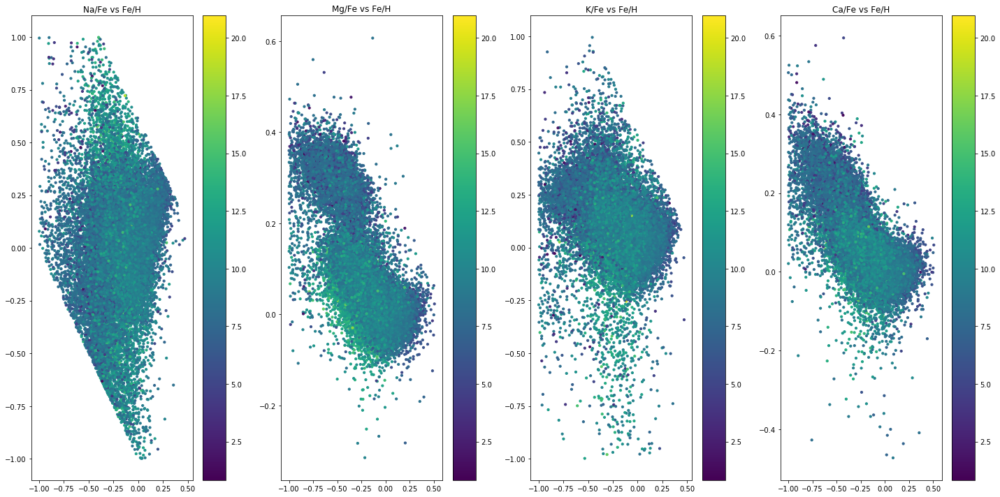

In [39]:
nacut = (np.abs(NA_FE) < 1.)
mgcut = (np.abs(MG_FE) < 1.)
alcut = (np.abs(AL_FE) < 1.)
sicut = (np.abs(SI_FE) < 1.)

plt.figure(figsize=(20, 10))
ax5 = plt.subplot(1,4,1)
P5 = ax5.scatter(FE_H[nacut], NA_FE[nacut], s=10, c=RAD[nacut])
plt.title('Na/Fe vs Fe/H')
plt.colorbar(P5)
ax6 = plt.subplot(1,4,2)
P6 = ax6.scatter(FE_H[mgcut], MG_FE[mgcut], s=10, c=RAD[mgcut])
plt.title('Mg/Fe vs Fe/H')
plt.colorbar(P6)
ax7 = plt.subplot(1,4,3)
P7 = ax7.scatter(FE_H[alcut], AL_FE[alcut], s=10, c=RAD[alcut])
plt.title('K/Fe vs Fe/H')
plt.colorbar(P7)
ax8 = plt.subplot(1,4,4)
P8 = ax8.scatter(FE_H[sicut], SI_FE[sicut], s=10, c=RAD[sicut])
plt.title('Ca/Fe vs Fe/H')
plt.colorbar(P8)
plt.tight_layout()

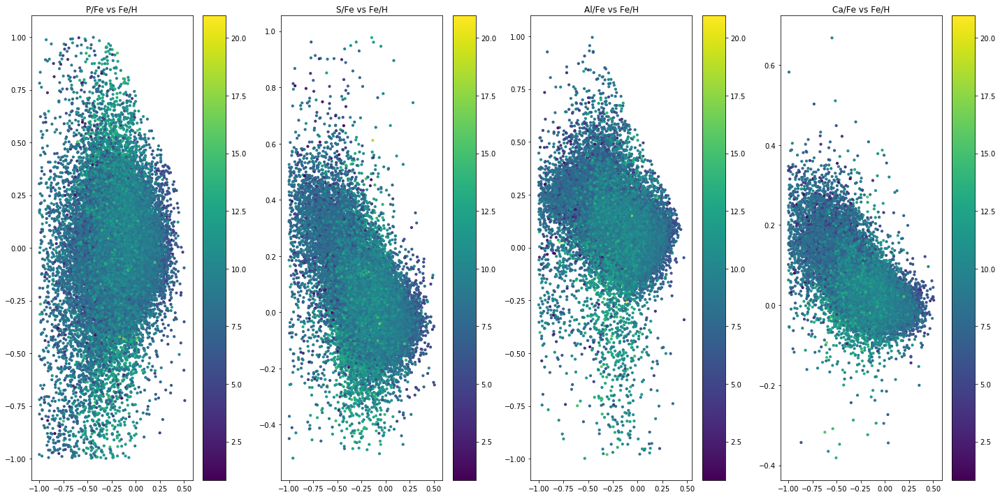

In [40]:
pcut = (np.abs(P_FE) < 1.)
scut = (np.abs(S_FE) < 1.)
kcut = (np.abs(K_FE) < 1.)
cacut = (np.abs(CA_FE) < 1.)

plt.figure(figsize=(20, 10))
ax9 = plt.subplot(1,4,1)
P9 = ax9.scatter(FE_H[pcut], P_FE[pcut], s=10, c=RAD[pcut])
plt.title('P/Fe vs Fe/H')
plt.colorbar(P9)
ax10 = plt.subplot(1,4,2)
P10 = ax10.scatter(FE_H[scut], S_FE[scut], s=10, c=RAD[scut])
plt.title('S/Fe vs Fe/H')
plt.colorbar(P10)
ax11 = plt.subplot(1,4,3)
P11 = ax11.scatter(FE_H[alcut], AL_FE[alcut], s=10, c=RAD[alcut])
plt.title('Al/Fe vs Fe/H')
plt.colorbar(P11)
ax12 = plt.subplot(1,4,4)
P12 = ax12.scatter(FE_H[cacut], CA_FE[cacut], s=10, c=RAD[cacut])
plt.title('Ca/Fe vs Fe/H')
plt.colorbar(P12)
plt.tight_layout()

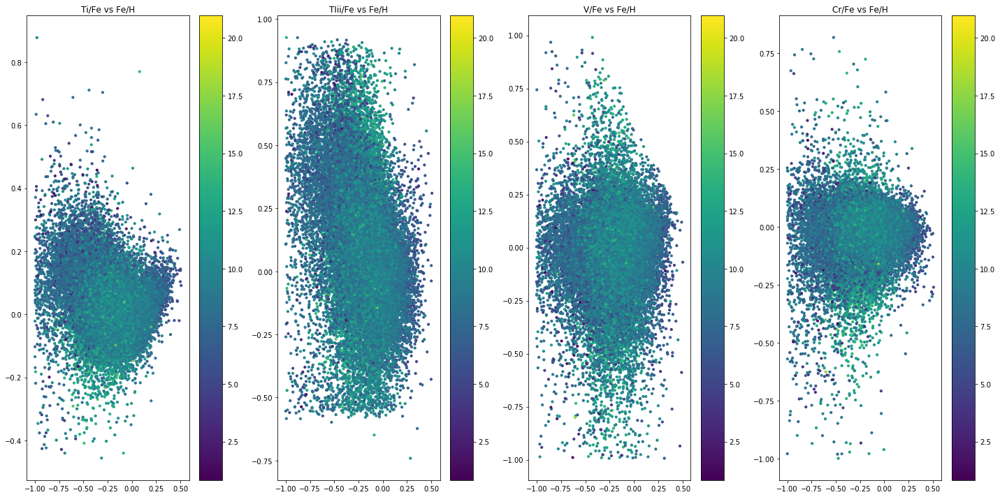

In [41]:
ticut = (np.abs(TI_FE) < 1.)
tiiicut = (np.abs(TIII_FE) < 1.)
vcut = (np.abs(V_FE) < 1.)
crcut = (np.abs(CR_FE) < 1.)

plt.figure(figsize=(20, 10))
ax13 = plt.subplot(1,4,1)
P13 = ax13.scatter(FE_H[ticut], TI_FE[ticut], s=10, c=RAD[ticut])
plt.title('Ti/Fe vs Fe/H')
plt.colorbar(P13)
ax14 = plt.subplot(1,4,2)
P14 = ax14.scatter(FE_H[tiiicut], TIII_FE[tiiicut], s=10, c=RAD[tiiicut])
plt.title('TIii/Fe vs Fe/H')
plt.colorbar(P14)
ax15 = plt.subplot(1,4,3)
P15 = ax15.scatter(FE_H[vcut], V_FE[vcut], s=10, c=RAD[vcut])
plt.title('V/Fe vs Fe/H')
plt.colorbar(P15)
ax16 = plt.subplot(1,4,4)
P16 = ax16.scatter(FE_H[crcut], CR_FE[crcut], s=10, c=RAD[crcut])
plt.title('Cr/Fe vs Fe/H')
plt.colorbar(P16)
plt.tight_layout()

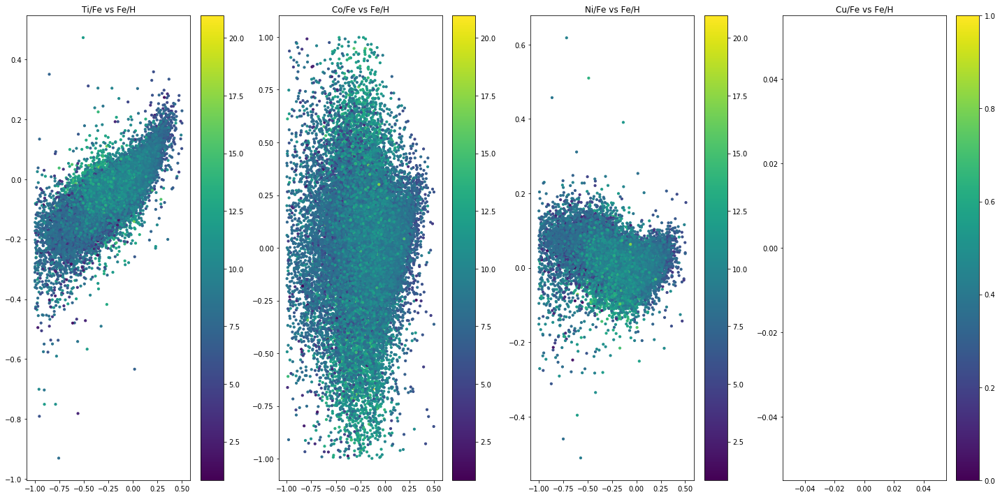

In [42]:
mncut = (np.abs(MN_FE) < 1.)
cocut = (np.abs(CO_FE) < 1.)
nicut = (np.abs(NI_FE) < 1.)
cucut = (np.abs(CU_FE) < 1.)

plt.figure(figsize=(20, 10))
ax17 = plt.subplot(1,4,1)
P17 = ax17.scatter(FE_H[mncut], MN_FE[mncut], s=10, c=RAD[mncut])
plt.title('Ti/Fe vs Fe/H')
plt.colorbar(P17)
ax18 = plt.subplot(1,4,2)
P18 = ax18.scatter(FE_H[cocut], CO_FE[cocut], s=10, c=RAD[cocut])
plt.title('Co/Fe vs Fe/H')
plt.colorbar(P18)
ax19 = plt.subplot(1,4,3)
P19 = ax19.scatter(FE_H[nicut], NI_FE[nicut], s=10, c=RAD[nicut])
plt.title('Ni/Fe vs Fe/H')
plt.colorbar(P19)
ax20 = plt.subplot(1,4,4)
P20 = ax20.scatter(FE_H[cucut], CU_FE[cucut], s=10, c=RAD[cucut])
plt.title('Cu/Fe vs Fe/H')
plt.colorbar(P20)
plt.tight_layout()

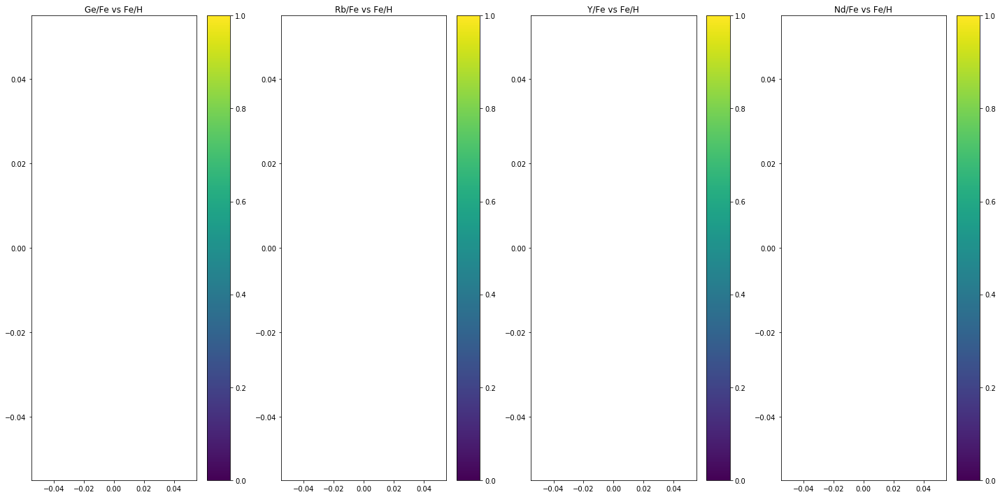

In [43]:
gecut = (np.abs(GE_FE) < 1.)
rbcut = (np.abs(RB_FE) < 1.)
ycut = (np.abs(Y_FE) < 1.)
ndcut = (np.abs(ND_FE) < 1.)

plt.figure(figsize=(20, 10))
ax21 = plt.subplot(1,4,1)
P21 = ax21.scatter(FE_H[gecut], GE_FE[gecut], s=10, c=RAD[gecut])
plt.title('Ge/Fe vs Fe/H')
plt.colorbar(P21)
ax22 = plt.subplot(1,4,2)
P22 = ax22.scatter(FE_H[rbcut], RB_FE[rbcut], s=10, c=RAD[rbcut])
plt.title('Rb/Fe vs Fe/H')
plt.colorbar(P22)
ax23 = plt.subplot(1,4,3)
P23 = ax23.scatter(FE_H[ycut], Y_FE[ycut], s=10, c=RAD[ycut])
plt.title('Y/Fe vs Fe/H')
plt.colorbar(P23)
ax24 = plt.subplot(1,4,4)
P24 = ax24.scatter(FE_H[ndcut], ND_FE[ndcut], s=10, c=RAD[ndcut])
plt.title('Nd/Fe vs Fe/H')
plt.colorbar(P24)
plt.tight_layout()

The mean is:  -0.07165253
The max is:  0.8771679
The min is:  -0.70704573
High carbon from 0 kpc to 2 kpc is: 40
Low carbon from 0 kpc to 2 kpc is: 7
High carbon from 2 kpc to 4 kpc is: 150
Low carbon from 2 kpc to 4 kpc is: 28
High carbon from 4 kpc to 6 kpc is: 780
Low carbon from 4 kpc to 6 kpc is: 274
High carbon from 6 kpc to 8 kpc is: 3170
Low carbon from 6 kpc to 8 kpc is: 1832
High carbon from 8 kpc to 10 kpc is: 5696
Low carbon from 8 kpc to 10 kpc is: 8244
High carbon from 10 kpc to 12 kpc is: 5875
Low carbon from 10 kpc to 12 kpc is: 8761
High carbon from 12 kpc to 14 kpc is: 2628
Low carbon from 12 kpc to 14 kpc is: 3322
High carbon from 14 kpc to 16 kpc is: 338
Low carbon from 14 kpc to 16 kpc is: 421


Text(0,0.5,'$C_{high}/{C_low}$')

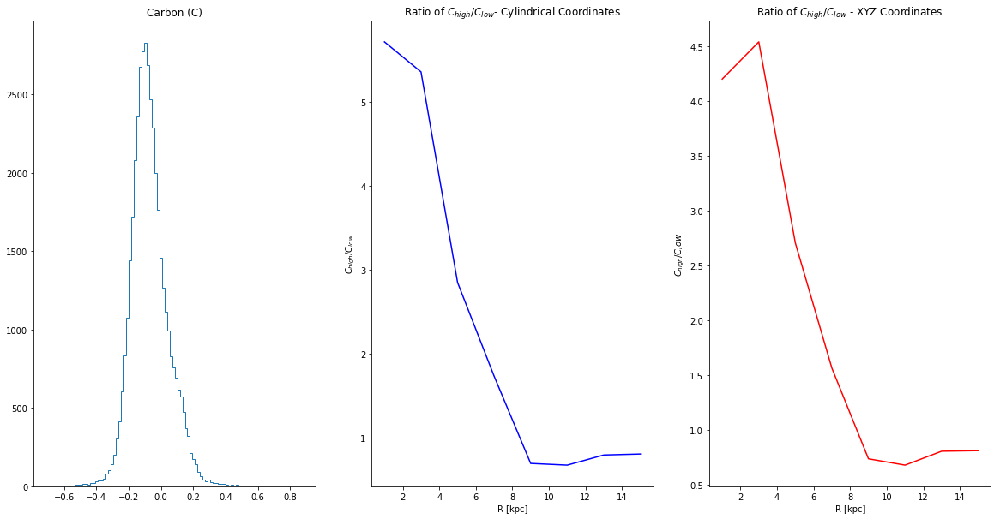

In [126]:
C = C_FE[ccut]
avgc = np.mean(C)
plt.figure(figsize=(20,10))
axc1 = plt.subplot(1,3,1)
plt.title('Carbon (C)')
HC = axc1.hist(C, bins=100, histtype='step')
print("The mean is: ",avgc)
print("The max is: ",max(C))
print("The min is: ",min(C))

high_carbon_stars = []
low_carbon_stars = []
carbon_ratio = []
axc2 = plt.subplot(1,3,2)
plt.title('Ratio of '+(r'$C_{high}/C_{low}$')+'- Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    crcut = np.logical_and(CYLRAD[ccut] > minr, CYLRAD[ccut] <= maxr)
    high_carbon_index = (C >= avgc) & crcut
    low_carbon_index = (C < avgc) & crcut
    high_carbon = np.sum(high_carbon_index)
    low_carbon = np.sum(low_carbon_index)
    print("High carbon from",minr,"kpc to",maxr,"kpc is:",high_carbon)
    print("Low carbon from",minr,"kpc to",maxr,"kpc is:",low_carbon)
    high_carbon_stars.append(high_carbon)
    low_carbon_stars.append(low_carbon)
    ratio_carbon = float(high_carbon)/low_carbon
    carbon_ratio.append(ratio_carbon)
plt.plot(0.5*(minRadius + maxRadius), carbon_ratio, c='b')
plt.xlabel('R [kpc]')
plt.ylabel(r'$C_{high}/C_{low}$')

xyzcarbon_ratio = []
axc3 = plt.subplot(1,3,3)
plt.title('Ratio of '+r'$C_{high}/C_{low}$'+' - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    rcut = np.logical_and(RAD[ccut] > minr, RAD[ccut] <= maxr)
    xyzhigh_carbon_index = (C >= avgc) & rcut
    xyzlow_carbon_index = (C < avgc) & rcut
    high_carbonxyz = np.sum(xyzhigh_carbon_index)
    low_carbonxyz = np.sum(xyzlow_carbon_index)
    xyzratio_carbon = float(high_carbonxyz)/low_carbonxyz
    xyzcarbon_ratio.append(xyzratio_carbon)
plt.plot(0.5*(minRadius + maxRadius), xyzcarbon_ratio, c='r')
plt.xlabel('R [kpc]')
plt.ylabel(r'$C_{high}/{C_low}$')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: RuntimeWarning: divide by zero encountered in true_divide


Text(0,0.5,'$C_{high}/C_{low}$')

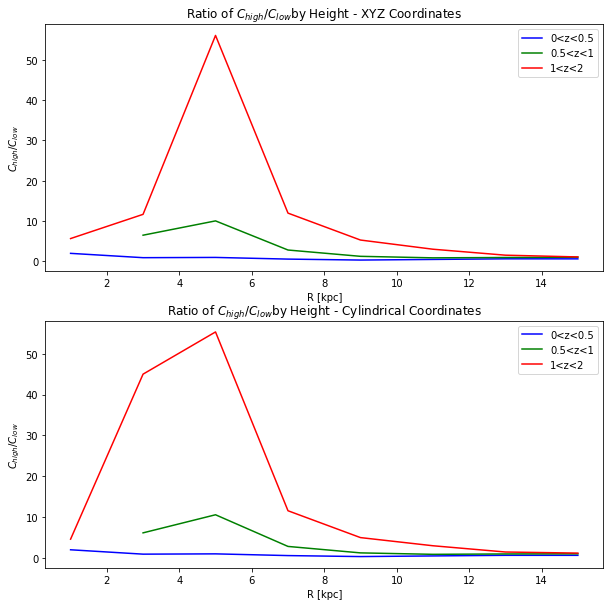

In [127]:
plt.figure(figsize=(10,10))
zbincolors = ["blue", "green", "red"]
zbinnames = ["0<z<0.5", "0.5<z<1", "1<z<2"]
azcarbon_ratio = []
bzcarbon_ratio = []
czcarbon_ratio = []
axc4 = plt.subplot(2,1,1)
plt.title('Ratio of '+r'$C_{high}/C_{low}$'+'by Height - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(RAD[ccut] > minr, RAD[ccut] <= maxr)
    xyzhigh_carbon_index = (C >= avgc) & zrcut
    high_carbonxyz = np.sum(xyzhigh_carbon_index)
    xyzlow_carbon_index = (C < avgc) & zrcut
    low_carbonxyz = np.sum(xyzhigh_carbon_index)
    azcut = np.logical_and(np.abs(HEIGHT[ccut]) > 0., np.abs(HEIGHT[ccut]) <= 0.5)
    bzcut = np.logical_and(np.abs(HEIGHT[ccut]) > 0.5, np.abs(HEIGHT[ccut]) <= 1.0)
    czcut = np.logical_and(np.abs(HEIGHT[ccut]) > 1.0, np.abs(HEIGHT[ccut]) <= 2.0)
    azhigh_carbon_index = xyzhigh_carbon_index[azcut]
    bzhigh_carbon_index = xyzhigh_carbon_index[bzcut]
    czhigh_carbon_index = xyzhigh_carbon_index[czcut]
    azlow_carbon_index = xyzlow_carbon_index[azcut]
    bzlow_carbon_index = xyzlow_carbon_index[bzcut]
    czlow_carbon_index = xyzlow_carbon_index[czcut]
    high_carbonaz = np.sum(azhigh_carbon_index)
    high_carbonbz = np.sum(bzhigh_carbon_index)
    high_carboncz = np.sum(czhigh_carbon_index)
    low_carbonaz = np.sum(azlow_carbon_index)
    low_carbonbz = np.sum(bzlow_carbon_index)
    low_carboncz = np.sum(czlow_carbon_index)
    azratio_carbon = float(high_carbonaz)/low_carbonaz
    bzratio_carbon = float(high_carbonbz)/low_carbonbz
    czratio_carbon = float(high_carboncz)/low_carboncz
    azcarbon_ratio.append(azratio_carbon)
    bzcarbon_ratio.append(bzratio_carbon)
    czcarbon_ratio.append(czratio_carbon)
plt.plot(0.5*(minRadius + maxRadius), azcarbon_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bzcarbon_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), czcarbon_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$C_{high}/C_{low}$')

aczcarbon_ratio = []
bczcarbon_ratio = []
cczcarbon_ratio = []
axc5 = plt.subplot(2,1,2)
plt.title('Ratio of '+r'$C_{high}/C_{low}$'+'by Height - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(CYLRAD[ccut] > minr, CYLRAD[ccut] <= maxr)
    czhigh_carbon_index = (C >= avgc) & zrcut
    high_carboncz = np.sum(czhigh_carbon_index)
    czlow_carbon_index = (C < avgc) & zrcut
    low_carboncz = np.sum(czhigh_carbon_index)
    aczcut = np.logical_and(np.abs(HEIGHT[ccut]) > 0., np.abs(HEIGHT[ccut]) <= 0.5)
    bczcut = np.logical_and(np.abs(HEIGHT[ccut]) > 0.5, np.abs(HEIGHT[ccut]) <= 1.0)
    cczcut = np.logical_and(np.abs(HEIGHT[ccut]) > 1.0, np.abs(HEIGHT[ccut]) <= 2.0)
    aczhigh_carbon_index = czhigh_carbon_index[aczcut]
    bczhigh_carbon_index = czhigh_carbon_index[bczcut]
    cczhigh_carbon_index = czhigh_carbon_index[cczcut]
    aczlow_carbon_index = czlow_carbon_index[aczcut]
    bczlow_carbon_index = czlow_carbon_index[bczcut]
    cczlow_carbon_index = czlow_carbon_index[cczcut]
    high_carbonacz = np.sum(aczhigh_carbon_index)
    high_carbonbcz = np.sum(bczhigh_carbon_index)
    high_carbonccz = np.sum(cczhigh_carbon_index)
    low_carbonacz = np.sum(aczlow_carbon_index)
    low_carbonbcz = np.sum(bczlow_carbon_index)
    low_carbonccz = np.sum(cczlow_carbon_index)
    aczratio_carbon = float(high_carbonacz)/low_carbonacz
    bczratio_carbon = float(high_carbonbcz)/low_carbonbcz
    cczratio_carbon = float(high_carbonccz)/low_carbonccz
    aczcarbon_ratio.append(aczratio_carbon)
    bczcarbon_ratio.append(bczratio_carbon)
    cczcarbon_ratio.append(cczratio_carbon)
plt.plot(0.5*(minRadius + maxRadius), aczcarbon_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bczcarbon_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), cczcarbon_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$C_{high}/C_{low}$')


The mean is:  -0.10986038
The max is:  0.86651784
The min is:  -0.76857156


Text(0,0.5,'$Cl_{high}/{Cl_low}$')

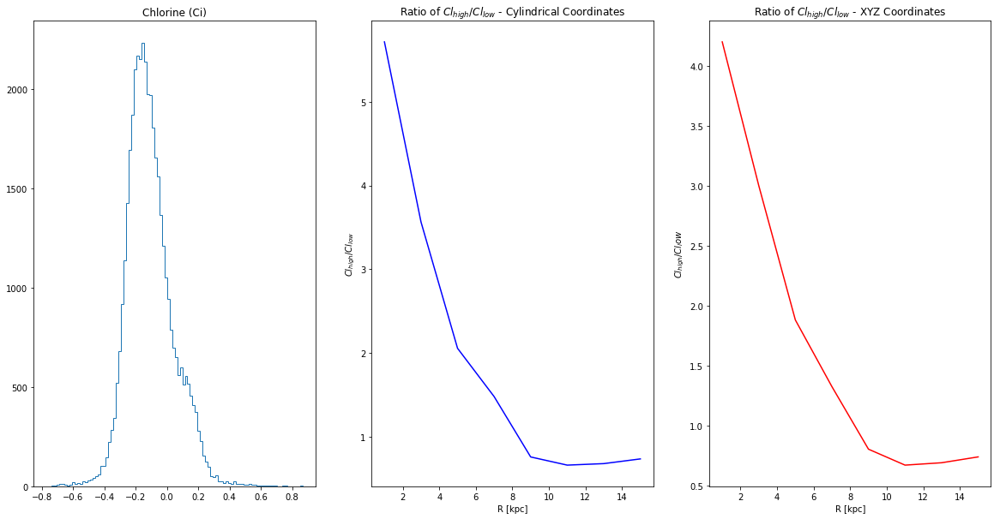

In [130]:
CL = CI_FE[cicut]
avgcl = np.mean(CL)
plt.figure(figsize=(20,10))
axcl1 = plt.subplot(1,3,1)
plt.title('Chlorine (Ci)')
HCL = axcl1.hist(CL, bins=100, histtype='step')
print("The mean is: ",avgcl)
print("The max is: ",max(CL))
print("The min is: ",min(CL))

high_chlorine_stars = []
low_chlorine_stars = []
chlorine_ratio = []
axcl2 = plt.subplot(1,3,2)
plt.title('Ratio of '+r'$Cl_{high}/Cl_{low}$'+' - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    crcut = np.logical_and(CYLRAD[cicut] > minr, CYLRAD[cicut] <= maxr)
    high_chlorine_index = (CL >= avgcl) & crcut
    low_chlorine_index = (CL < avgcl) & crcut
    high_chlorine = np.sum(high_chlorine_index)
    low_chlorine = np.sum(low_chlorine_index)
    high_chlorine_stars.append(high_chlorine)
    low_chlorine_stars.append(low_chlorine)
    ratio_chlorine = float(high_chlorine)/low_chlorine
    chlorine_ratio.append(ratio_chlorine)
plt.plot(0.5*(minRadius + maxRadius), chlorine_ratio, c='b')
plt.xlabel('R [kpc]')
plt.ylabel(r'$Cl_{high}/Cl_{low}$')

xyzchlorine_ratio = []
axc3 = plt.subplot(1,3,3)
plt.title('Ratio of '+r'$Cl_{high}/Cl_{low}$'+' - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    rcut = np.logical_and(RAD[cicut] > minr, RAD[cicut] <= maxr)
    xyzhigh_chlorine_index = (CL >= avgcl) & rcut
    xyzlow_chlorine_index = (CL < avgcl) & rcut
    high_chlorinexyz = np.sum(xyzhigh_chlorine_index)
    low_chlorinexyz = np.sum(xyzlow_chlorine_index)
    xyzratio_chlorine = float(high_chlorinexyz)/low_chlorinexyz
    xyzchlorine_ratio.append(xyzratio_chlorine)
plt.plot(0.5*(minRadius + maxRadius), xyzchlorine_ratio, c='r')
plt.xlabel('R [kpc]')
plt.ylabel(r'$Cl_{high}/{Cl_low}$')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: RuntimeWarning: divide by zero encountered in true_divide


Text(0,0.5,'$Cl_{high}/Cl_{low}$')

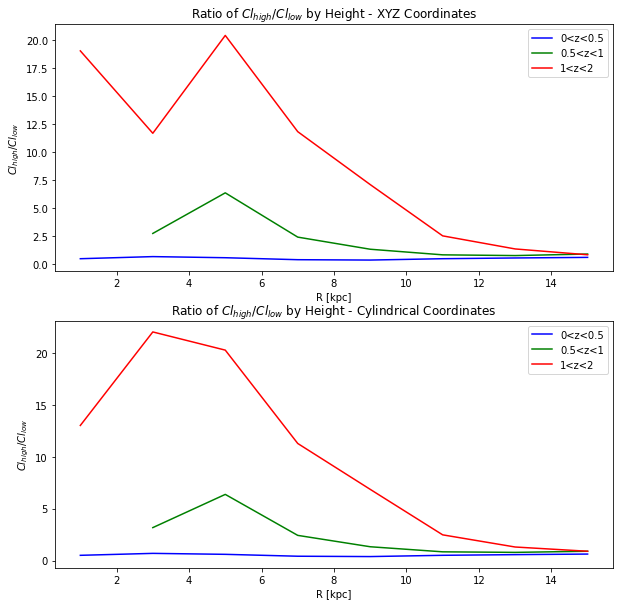

In [133]:
plt.figure(figsize=(10,10))
zbincolors = ["blue", "green", "red"]
zbinnames = ["0<z<0.5", "0.5<z<1", "1<z<2"]
azchlorine_ratio = []
bzchlorine_ratio = []
czchlorine_ratio = []
axcl4 = plt.subplot(2,1,1)
plt.title('Ratio of '+r'$Cl_{high}/Cl_{low}$'+' by Height - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(RAD[cicut] > minr, RAD[cicut] <= maxr)
    xyzhigh_chlorine_index = (CL >= avgcl) & zrcut
    high_chlorinexyz = np.sum(xyzhigh_chlorine_index)
    xyzlow_chlorine_index = (CL < avgcl) & zrcut
    low_chlorinexyz = np.sum(xyzhigh_chlorine_index)
    azcut = np.logical_and(np.abs(HEIGHT[cicut]) > 0.0, np.abs(HEIGHT[cicut]) <= 0.5)
    bzcut = np.logical_and(np.abs(HEIGHT[cicut]) > 0.5, np.abs(HEIGHT[cicut]) <= 1.0)
    czcut = np.logical_and(np.abs(HEIGHT[cicut]) > 1.0, np.abs(HEIGHT[cicut]) <= 2.0)
    azhigh_chlorine_index = xyzhigh_chlorine_index[azcut]
    bzhigh_chlorine_index = xyzhigh_chlorine_index[bzcut]
    czhigh_chlorine_index = xyzhigh_chlorine_index[czcut]
    azlow_chlorine_index = xyzlow_chlorine_index[azcut]
    bzlow_chlorine_index = xyzlow_chlorine_index[bzcut]
    czlow_chlorine_index = xyzlow_chlorine_index[czcut]
    high_chlorineaz = np.sum(azhigh_chlorine_index)
    high_chlorinebz = np.sum(bzhigh_chlorine_index)
    high_chlorinecz = np.sum(czhigh_chlorine_index)
    low_chlorineaz = np.sum(azlow_chlorine_index)
    low_chlorinebz = np.sum(bzlow_chlorine_index)
    low_chlorinecz = np.sum(czlow_chlorine_index)
    azratio_chlorine = float(high_chlorineaz)/low_chlorineaz
    bzratio_chlorine = float(high_chlorinebz)/low_chlorinebz
    czratio_chlorine = float(high_chlorinecz)/low_chlorinecz
    azchlorine_ratio.append(azratio_chlorine)
    bzchlorine_ratio.append(bzratio_chlorine)
    czchlorine_ratio.append(czratio_chlorine)
plt.plot(0.5*(minRadius + maxRadius), azchlorine_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bzchlorine_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), czchlorine_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$Cl_{high}/Cl_{low}$')

aczchlorine_ratio = []
bczchlorine_ratio = []
cczchlorine_ratio = []
axc5 = plt.subplot(2,1,2)
plt.title('Ratio of '+r'$Cl_{high}/Cl_{low}$'+' by Height - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(CYLRAD[cicut] > minr, CYLRAD[cicut] <= maxr)
    czhigh_chlorine_index = (CL >= avgcl) & zrcut
    high_chlorinecz = np.sum(czhigh_chlorine_index)
    czlow_chlorine_index = (CL < avgcl) & zrcut
    low_chlorinecz = np.sum(czhigh_chlorine_index)
    aczcut = np.logical_and(np.abs(HEIGHT[cicut]) > 0., np.abs(HEIGHT[cicut]) <= 0.5)
    bczcut = np.logical_and(np.abs(HEIGHT[cicut]) > 0.5, np.abs(HEIGHT[cicut]) <= 1.0)
    cczcut = np.logical_and(np.abs(HEIGHT[cicut]) > 1.0, np.abs(HEIGHT[cicut]) <= 2.0)
    aczhigh_chlorine_index = czhigh_chlorine_index[aczcut]
    bczhigh_chlorine_index = czhigh_chlorine_index[bczcut]
    cczhigh_chlorine_index = czhigh_chlorine_index[cczcut]
    aczlow_chlorine_index = czlow_chlorine_index[aczcut]
    bczlow_chlorine_index = czlow_chlorine_index[bczcut]
    cczlow_chlorine_index = czlow_chlorine_index[cczcut]
    high_chlorineacz = np.sum(aczhigh_chlorine_index)
    high_chlorinebcz = np.sum(bczhigh_chlorine_index)
    high_chlorineccz = np.sum(cczhigh_chlorine_index)
    low_chlorineacz = np.sum(aczlow_chlorine_index)
    low_chlorinebcz = np.sum(bczlow_chlorine_index)
    low_chlorineccz = np.sum(cczlow_chlorine_index)
    aczratio_chlorine = float(high_chlorineacz)/low_chlorineacz
    bczratio_chlorine = float(high_chlorinebcz)/low_chlorinebcz
    cczratio_chlorine = float(high_chlorineccz)/low_chlorineccz
    aczchlorine_ratio.append(aczratio_chlorine)
    bczchlorine_ratio.append(bczratio_chlorine)
    cczchlorine_ratio.append(cczratio_chlorine)
plt.plot(0.5*(minRadius + maxRadius), aczchlorine_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bczchlorine_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), cczchlorine_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$Cl_{high}/Cl_{low}$')

The mean is:  0.27068073
The max is:  0.9144439
The min is:  -0.92705214


Text(0,0.5,'$N_{high}/N_{low}$')

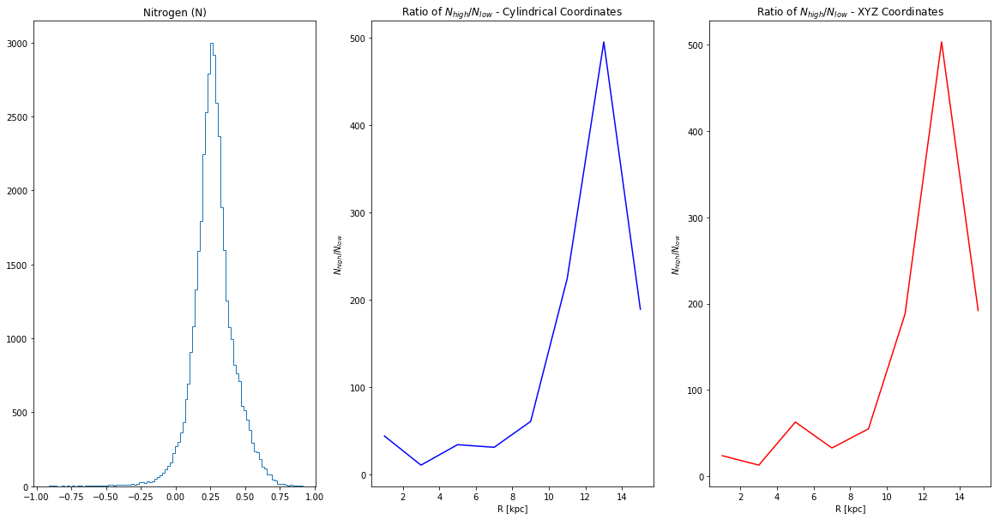

In [135]:
N = N_FE[ncut]
avgn = np.mean(N)
plt.figure(figsize=(20,10))
axn1 = plt.subplot(1,3,1)
plt.title('Nitrogen (N)')
HN = axn1.hist(N, bins=100, histtype='step')
print("The mean is: ",avgn)
print("The max is: ",max(N))
print("The min is: ",min(N))

high_nitrogen_stars = []
low_nitrogen_stars = []
nitrogen_ratio = []
axn2 = plt.subplot(1,3,2)
plt.title('Ratio of '+r'$N_{high}/N_{low}$'+' - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    crcut = np.logical_and(CYLRAD[ncut] > minr, CYLRAD[ncut] <= maxr)
    high_nitrogen_index = (N >= avgcl) & crcut
    low_nitrogen_index = (N < avgcl) & crcut
    high_nitrogen = np.sum(high_nitrogen_index)
    low_nitrogen = np.sum(low_nitrogen_index)
    high_nitrogen_stars.append(high_nitrogen)
    low_nitrogen_stars.append(low_nitrogen)
    ratio_nitrogen = float(high_nitrogen)/low_nitrogen
    nitrogen_ratio.append(ratio_nitrogen)
plt.plot(0.5*(minRadius + maxRadius), nitrogen_ratio, c='b')
plt.xlabel('R [kpc]')
plt.ylabel(r'$N_{high}/N_{low}$')

xyznitrogen_ratio = []
axn3 = plt.subplot(1,3,3)
plt.title('Ratio of '+r'$N_{high}/N_{low}$'+' - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    rcut = np.logical_and(RAD[ncut] > minr, RAD[ncut] <= maxr)
    xyzhigh_nitrogen_index = (N >= avgcl) & rcut
    xyzlow_nitrogen_index = (N < avgcl) & rcut
    high_nitrogenxyz = np.sum(xyzhigh_nitrogen_index)
    low_nitrogenxyz = np.sum(xyzlow_nitrogen_index)
    xyzratio_nitrogen = float(high_nitrogenxyz)/low_nitrogenxyz
    xyznitrogen_ratio.append(xyzratio_nitrogen)
plt.plot(0.5*(minRadius + maxRadius), xyznitrogen_ratio, c='r')
plt.xlabel('R [kpc]')
plt.ylabel(r'$N_{high}/N_{low}$')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: RuntimeWarning: divide by zero encountered in true_divide


Text(0,0.5,'$N_{high}/N_{low}$')

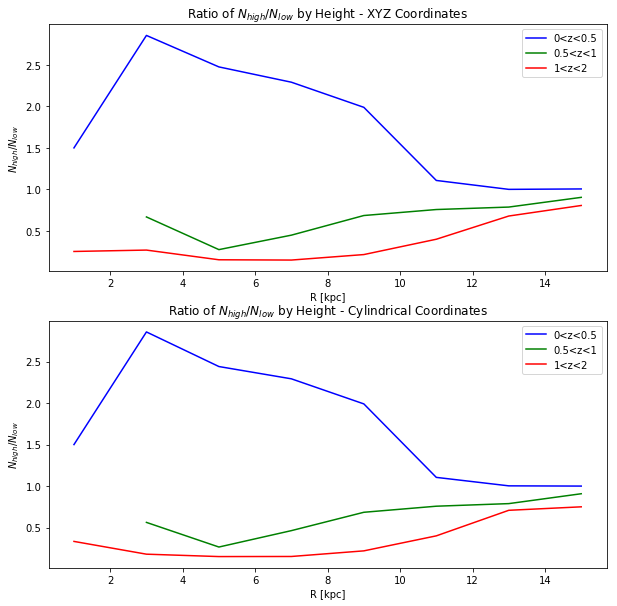

In [136]:
plt.figure(figsize=(10,10))
zbincolors = ["blue", "green", "red"]
zbinnames = ["0<z<0.5", "0.5<z<1", "1<z<2"]
aznitrogen_ratio = []
bznitrogen_ratio = []
cznitrogen_ratio = []
axn4 = plt.subplot(2,1,1)
plt.title('Ratio of '+r'$N_{high}/N_{low}$'+' by Height - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(RAD[ncut] > minr, RAD[ncut] <= maxr)
    xyzhigh_nitrogen_index = (N >= avgn) & zrcut
    high_nitrogenxyz = np.sum(xyzhigh_nitrogen_index)
    xyzlow_nitrogen_index = (N < avgn) & zrcut
    low_nitrogenxyz = np.sum(xyzhigh_nitrogen_index)
    azcut = np.logical_and(np.abs(HEIGHT[ncut]) > 0.0, np.abs(HEIGHT[ncut]) <= 0.5)
    bzcut = np.logical_and(np.abs(HEIGHT[ncut]) > 0.5, np.abs(HEIGHT[ncut]) <= 1.0)
    czcut = np.logical_and(np.abs(HEIGHT[ncut]) > 1.0, np.abs(HEIGHT[ncut]) <= 2.0)
    azhigh_nitrogen_index = xyzhigh_nitrogen_index[azcut]
    bzhigh_nitrogen_index = xyzhigh_nitrogen_index[bzcut]
    czhigh_nitrogen_index = xyzhigh_nitrogen_index[czcut]
    azlow_nitrogen_index = xyzlow_nitrogen_index[azcut]
    bzlow_nitrogen_index = xyzlow_nitrogen_index[bzcut]
    czlow_nitrogen_index = xyzlow_nitrogen_index[czcut]
    high_nitrogenaz = np.sum(azhigh_nitrogen_index)
    high_nitrogenbz = np.sum(bzhigh_nitrogen_index)
    high_nitrogencz = np.sum(czhigh_nitrogen_index)
    low_nitrogenaz = np.sum(azlow_nitrogen_index)
    low_nitrogenbz = np.sum(bzlow_nitrogen_index)
    low_nitrogencz = np.sum(czlow_nitrogen_index)
    azratio_nitrogen = float(high_nitrogenaz)/low_nitrogenaz
    bzratio_nitrogen = float(high_nitrogenbz)/low_nitrogenbz
    czratio_nitrogen = float(high_nitrogencz)/low_nitrogencz
    aznitrogen_ratio.append(azratio_nitrogen)
    bznitrogen_ratio.append(bzratio_nitrogen)
    cznitrogen_ratio.append(czratio_nitrogen)
plt.plot(0.5*(minRadius + maxRadius), aznitrogen_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bznitrogen_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), cznitrogen_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$N_{high}/N_{low}$')

acznitrogen_ratio = []
bcznitrogen_ratio = []
ccznitrogen_ratio = []
axc5 = plt.subplot(2,1,2)
plt.title('Ratio of '+r'$N_{high}/N_{low}$'+' by Height - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(CYLRAD[ncut] > minr, CYLRAD[ncut] <= maxr)
    czhigh_nitrogen_index = (N >= avgn) & zrcut
    high_nitrogencz = np.sum(czhigh_nitrogen_index)
    czlow_nitrogen_index = (N < avgn) & zrcut
    low_nitrogencz = np.sum(czhigh_nitrogen_index)
    aczcut = np.logical_and(np.abs(HEIGHT[ncut]) > 0., np.abs(HEIGHT[ncut]) <= 0.5)
    bczcut = np.logical_and(np.abs(HEIGHT[ncut]) > 0.5, np.abs(HEIGHT[ncut]) <= 1.0)
    cczcut = np.logical_and(np.abs(HEIGHT[ncut]) > 1.0, np.abs(HEIGHT[ncut]) <= 2.0)
    aczhigh_nitrogen_index = czhigh_nitrogen_index[aczcut]
    bczhigh_nitrogen_index = czhigh_nitrogen_index[bczcut]
    cczhigh_nitrogen_index = czhigh_nitrogen_index[cczcut]
    aczlow_nitrogen_index = czlow_nitrogen_index[aczcut]
    bczlow_nitrogen_index = czlow_nitrogen_index[bczcut]
    cczlow_nitrogen_index = czlow_nitrogen_index[cczcut]
    high_nitrogenacz = np.sum(aczhigh_nitrogen_index)
    high_nitrogenbcz = np.sum(bczhigh_nitrogen_index)
    high_nitrogenccz = np.sum(cczhigh_nitrogen_index)
    low_nitrogenacz = np.sum(aczlow_nitrogen_index)
    low_nitrogenbcz = np.sum(bczlow_nitrogen_index)
    low_nitrogenccz = np.sum(cczlow_nitrogen_index)
    aczratio_nitrogen = float(high_nitrogenacz)/low_nitrogenacz
    bczratio_nitrogen = float(high_nitrogenbcz)/low_nitrogenbcz
    cczratio_nitrogen = float(high_nitrogenccz)/low_nitrogenccz
    acznitrogen_ratio.append(aczratio_nitrogen)
    bcznitrogen_ratio.append(bczratio_nitrogen)
    ccznitrogen_ratio.append(cczratio_nitrogen)
plt.plot(0.5*(minRadius + maxRadius), acznitrogen_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bcznitrogen_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), ccznitrogen_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$N_{high}/N_{low}$')

The mean is:  0.06354163
The max is:  0.97524536
The min is:  -0.51118237


Text(0,0.5,'$O_{high}/O_{low}$')

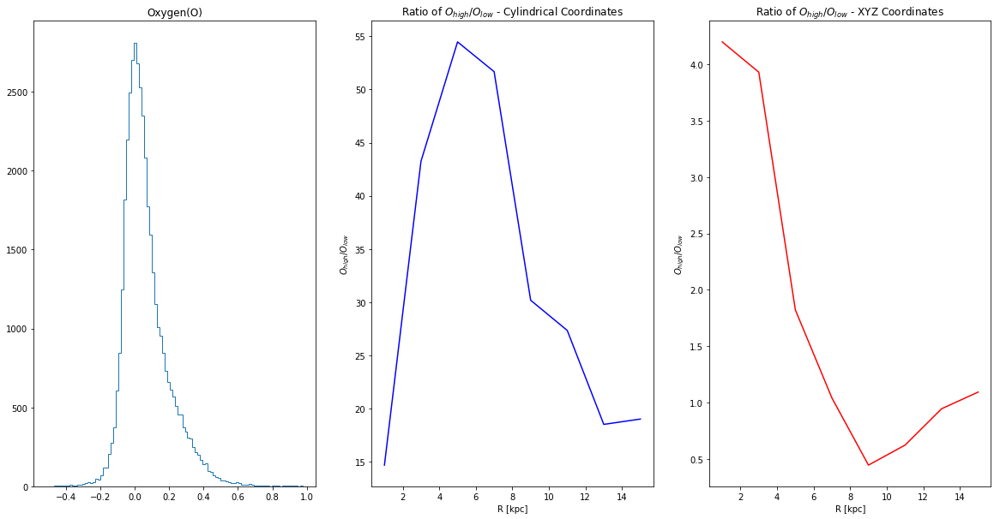

In [138]:
O = O_FE[ocut]
avgo = np.mean(O)
plt.figure(figsize=(20,10))
axo1 = plt.subplot(1,3,1)
plt.title('Oxygen(O)')
HO = axo1.hist(O, bins=100, histtype='step')
print("The mean is: ",avgo)
print("The max is: ",max(O))
print("The min is: ",min(O))

high_oxygen_stars = []
low_oxygen_stars = []
oxygen_ratio = []
axo2 = plt.subplot(1,3,2)
plt.title('Ratio of '+r'$O_{high}/O_{low}$'+' - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    crcut = np.logical_and(CYLRAD[ocut] > minr, CYLRAD[ocut] <= maxr)
    high_oxygen_index = (O >= avgcl) & crcut
    low_oxygen_index = (O < avgcl) & crcut
    high_oxygen = np.sum(high_oxygen_index)
    low_oxygen = np.sum(low_oxygen_index)
    high_oxygen_stars.append(high_oxygen)
    low_oxygen_stars.append(low_oxygen)
    ratio_oxygen = float(high_oxygen)/low_oxygen
    oxygen_ratio.append(ratio_oxygen)
plt.plot(0.5*(minRadius + maxRadius), oxygen_ratio, c='b')
plt.xlabel('R [kpc]')
plt.ylabel(r'$O_{high}/O_{low}$')

xyzoxygen_ratio = []
axo3 = plt.subplot(1,3,3)
plt.title('Ratio of '+r'$O_{high}/O_{low}$'+' - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    rcut = np.logical_and(RAD[ocut] > minr, RAD[ocut] <= maxr)
    xyzhigh_oxygen_index = (O >= avgo) & rcut
    xyzlow_oxygen_index = (O < avgo) & rcut
    high_oxygenxyz = np.sum(xyzhigh_oxygen_index)
    low_oxygenxyz = np.sum(xyzlow_oxygen_index)
    xyzratio_oxygen = float(high_oxygenxyz)/low_oxygenxyz
    xyzoxygen_ratio.append(xyzratio_oxygen)
plt.plot(0.5*(minRadius + maxRadius), xyzoxygen_ratio, c='r')
plt.xlabel('R [kpc]')
plt.ylabel(r'$O_{high}/O_{low}$')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: RuntimeWarning: divide by zero encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in true_divide


Text(0,0.5,'$O_{high}/O_{low}$')

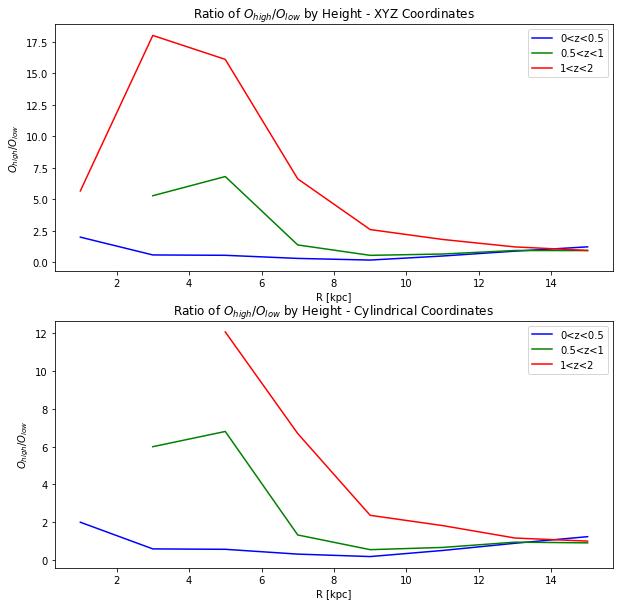

In [139]:
plt.figure(figsize=(10,10))
zbincolors = ["blue", "green", "red"]
zbinnames = ["0<z<0.5", "0.5<z<1", "1<z<2"]
azoxygen_ratio = []
bzoxygen_ratio = []
czoxygen_ratio = []
axo4 = plt.subplot(2,1,1)
plt.title('Ratio of '+r'$O_{high}/O_{low}$'+' by Height - XYZ Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(RAD[ocut] > minr, RAD[ocut] <= maxr)
    xyzhigh_oxygen_index = (O >= avgo) & zrcut
    high_oxygenxyz = np.sum(xyzhigh_oxygen_index)
    xyzlow_oxygen_index = (O < avgo) & zrcut
    low_oxygenxyz = np.sum(xyzhigh_oxygen_index)
    azcut = np.logical_and(np.abs(HEIGHT[ocut]) > 0.0, np.abs(HEIGHT[ocut]) <= 0.5)
    bzcut = np.logical_and(np.abs(HEIGHT[ocut]) > 0.5, np.abs(HEIGHT[ocut]) <= 1.0)
    czcut = np.logical_and(np.abs(HEIGHT[ocut]) > 1.0, np.abs(HEIGHT[ocut]) <= 2.0)
    azhigh_oxygen_index = xyzhigh_oxygen_index[azcut]
    bzhigh_oxygen_index = xyzhigh_oxygen_index[bzcut]
    czhigh_oxygen_index = xyzhigh_oxygen_index[czcut]
    azlow_oxygen_index = xyzlow_oxygen_index[azcut]
    bzlow_oxygen_index = xyzlow_oxygen_index[bzcut]
    czlow_oxygen_index = xyzlow_oxygen_index[czcut]
    high_oxygenaz = np.sum(azhigh_oxygen_index)
    high_oxygenbz = np.sum(bzhigh_oxygen_index)
    high_oxygencz = np.sum(czhigh_oxygen_index)
    low_oxygenaz = np.sum(azlow_oxygen_index)
    low_oxygenbz = np.sum(bzlow_oxygen_index)
    low_oxygencz = np.sum(czlow_oxygen_index)
    azratio_oxygen = float(high_oxygenaz)/low_oxygenaz
    bzratio_oxygen = float(high_oxygenbz)/low_oxygenbz
    czratio_oxygen = float(high_oxygencz)/low_oxygencz
    azoxygen_ratio.append(azratio_oxygen)
    bzoxygen_ratio.append(bzratio_oxygen)
    czoxygen_ratio.append(czratio_oxygen)
plt.plot(0.5*(minRadius + maxRadius), azoxygen_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bzoxygen_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), czoxygen_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$O_{high}/O_{low}$')

aczoxygen_ratio = []
bczoxygen_ratio = []
cczoxygen_ratio = []
axo5 = plt.subplot(2,1,2)
plt.title('Ratio of '+r'$O_{high}/O_{low}$'+' by Height - Cylindrical Coordinates')
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(CYLRAD[ocut] > minr, CYLRAD[ocut] <= maxr)
    czhigh_oxygen_index = (O >= avgo) & zrcut
    high_oxygencz = np.sum(czhigh_oxygen_index)
    czlow_oxygen_index = (O < avgo) & zrcut
    low_oxygencz = np.sum(czhigh_oxygen_index)
    aczcut = np.logical_and(np.abs(HEIGHT[ocut]) > 0.0, np.abs(HEIGHT[ocut]) <= 0.5)
    bczcut = np.logical_and(np.abs(HEIGHT[ocut]) > 0.5, np.abs(HEIGHT[ocut]) <= 1.0)
    cczcut = np.logical_and(np.abs(HEIGHT[ocut]) > 1.0, np.abs(HEIGHT[ocut]) <= 2.0)
    aczhigh_oxygen_index = czhigh_oxygen_index[aczcut]
    bczhigh_oxygen_index = czhigh_oxygen_index[bczcut]
    cczhigh_oxygen_index = czhigh_oxygen_index[cczcut]
    aczlow_oxygen_index = czlow_oxygen_index[aczcut]
    bczlow_oxygen_index = czlow_oxygen_index[bczcut]
    cczlow_oxygen_index = czlow_oxygen_index[cczcut]
    high_oxygenacz = np.sum(aczhigh_oxygen_index)
    high_oxygenbcz = np.sum(bczhigh_oxygen_index)
    high_oxygenccz = np.sum(cczhigh_oxygen_index)
    low_oxygenacz = np.sum(aczlow_oxygen_index)
    low_oxygenbcz = np.sum(bczlow_oxygen_index)
    low_oxygenccz = np.sum(cczlow_oxygen_index)
    aczratio_oxygen = float(high_oxygenacz)/low_oxygenacz
    bczratio_oxygen = float(high_oxygenbcz)/low_oxygenbcz
    cczratio_oxygen = float(high_oxygenccz)/low_oxygenccz
    aczoxygen_ratio.append(aczratio_oxygen)
    bczoxygen_ratio.append(bczratio_oxygen)
    cczoxygen_ratio.append(cczratio_oxygen)
plt.plot(0.5*(minRadius + maxRadius), aczoxygen_ratio, c='b')
plt.plot(0.5*(minRadius + maxRadius), bczoxygen_ratio, c='g')
plt.plot(0.5*(minRadius + maxRadius), cczoxygen_ratio, c='r')
plt.legend(zbinnames)
plt.xlabel('R [kpc]')
plt.ylabel(r'$O_{high}/O_{low}$')

41639

In [34]:

filename = 'gaia_spectro.hdf5'

a = Table.read(filename)

a.info

a.meta

nan

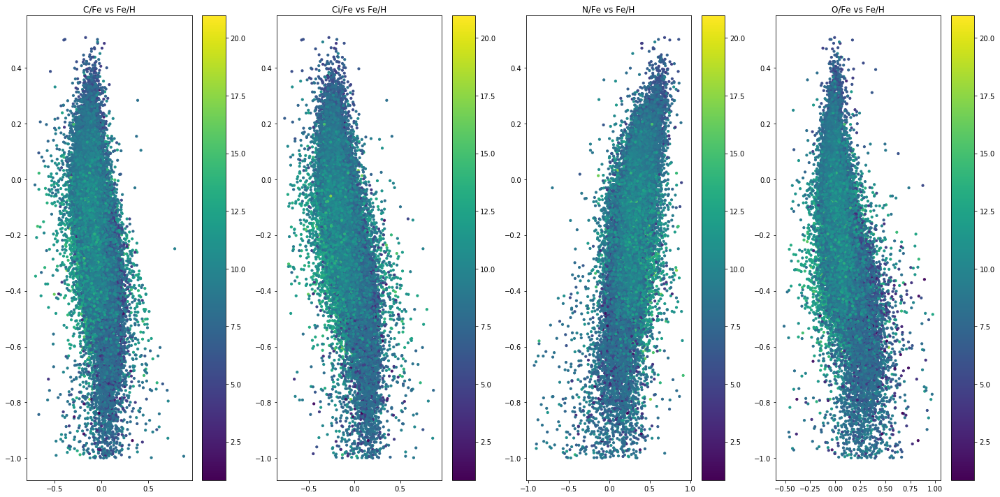

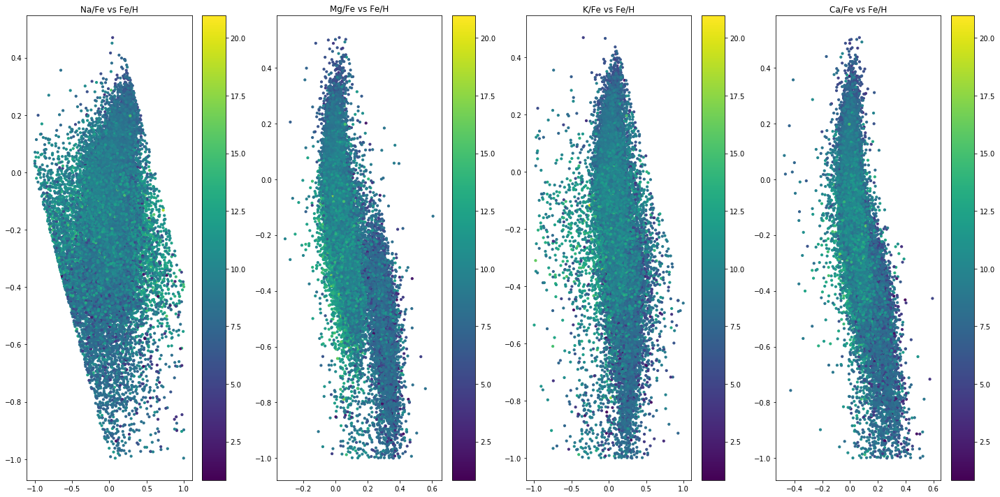

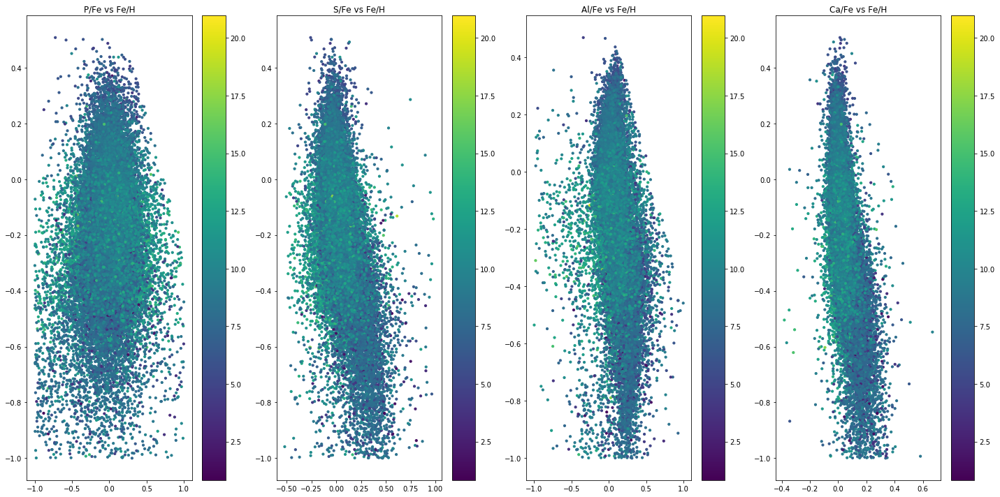

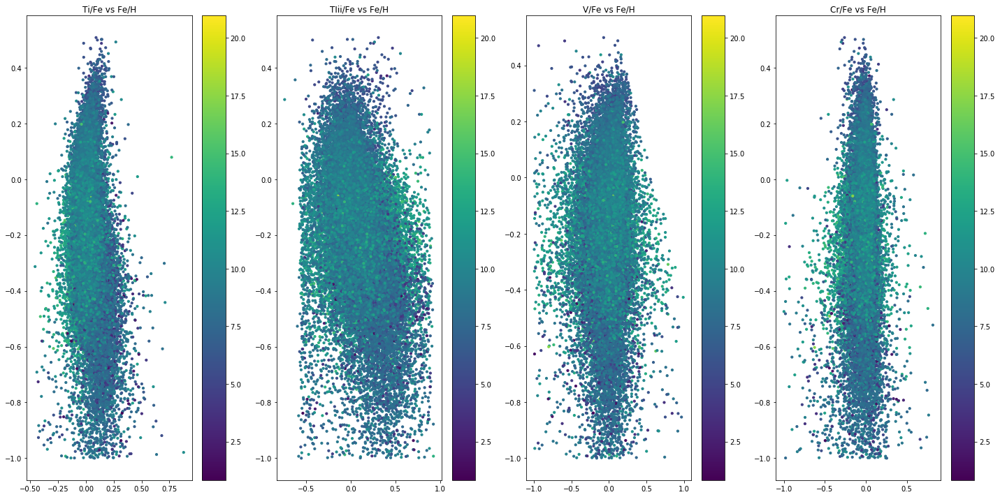

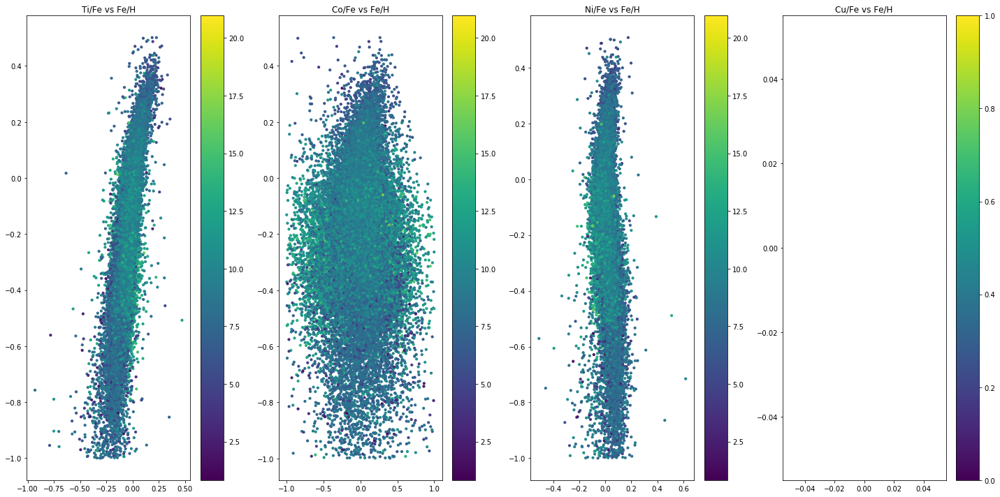

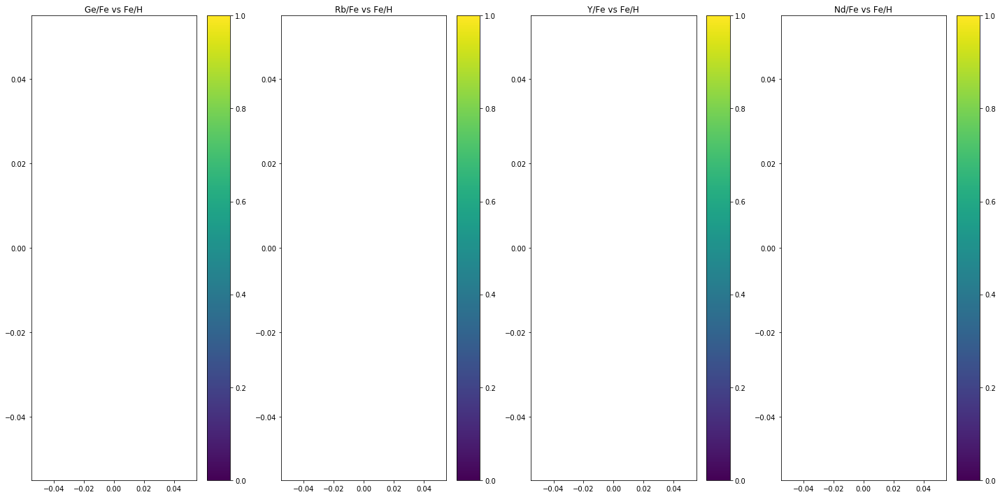

In [ ]:
##import the csv file of the MC distance values for actual errorbar info

The mean and std is:  14.666666666666666 0.0
The mean and std is:  6.416666666666667 0.0
The mean and std is:  1.6113861386138615 0.0
The mean and std is:  0.8908610271903323 0.0
The mean and std is:  0.26888080072793447 0.0
The mean and std is:  0.14954884268340526 0.0
The mean and std is:  0.15791520809023726 0.0
The mean and std is:  0.13095238095238096 0.0


Text(0.5,1,'Cylindrical Coordinates')

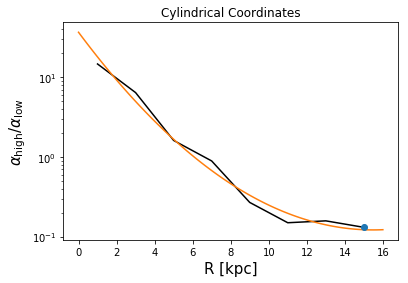

In [104]:
xval = np.arange(-1, 1, 0.05)
m = -0.05
c = 0.08
yval = m*xval + c
avg = np.mean(yval)
minZheights = [0.0, 0.5, 1.0]
maxZheights = [0.5, 1.0, 2.0]
mean_ratio_alpha = []
std_ratio_alpha = []
ratio_alpha = []
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    index_cr = np.logical_and( GSCYLRAD > minr, GSCYLRAD <= maxr)
    index_radius = np.logical_and(radius > minr, radius <= maxr)
    high_alpha_index = (GSAM > avg) & index_cr
    low_alpha_index = (GSAM <= avg) & index_cr

    nlow_alpha = np.sum(low_alpha_index)
    nhigh_alpha = np.sum(high_alpha_index)
    ratio_alpha = float(nhigh_alpha)/nlow_alpha

    print('The mean and std is: ',np.mean(ratio_alpha), np.std(ratio_alpha))
    mean_ratio_alpha.append(np.mean(ratio_alpha))
    std_ratio_alpha.append(np.std(ratio_alpha))
plt.errorbar(0.5*(minr + maxr), np.mean(ratio_alpha), yerr=np.std(ratio_alpha), fmt='o')
plt.plot(0.5*(minRadius + maxRadius), mean_ratio_alpha, c='k')
p = np.poly1d(np.polyfit(0.5*(minRadius + maxRadius), np.log10(mean_ratio_alpha), 2))
x = np.linspace(0, 16, 100)
plt.plot(x, 10**p(x))
plt.yscale('log')
plt.xlabel('R [kpc]', fontsize=15)
plt.ylabel(r'$\alpha_{\mathrm{high}}/\alpha_{\mathrm{low}}$', fontsize=15)
plt.title('Cylindrical Coordinates')

In [ ]:
##Plans for data - crossmatch with the ages of the stars - create graphs comparing ages to high/low alpha and other
##elements: average age and age distribution

##pull the coefficients out of the poly1d function that you used for the line of best fit - there is apparently a way
##to do this

In [82]:
import h5py
filename = 'gaia_spectro.hdf5'
f = h5py.File(filename, 'r')
data = f['data']

In [91]:
data.dtype

dtype([('obsid', '<f8'), ('dm', '<f8'), ('dm_err', '<f8'), ('dist', '<f8'), ('dist_err', '<f8'), ('par', '<f8'), ('par_err', '<f8'), ('log10_age', '<f8'), ('log10_age_err', '<f8'), ('mass', '<f8'), ('mass_err', '<f8'), ('Z', '<f8'), ('Z_err', '<f8'), ('log10_av', '<f8'), ('log10_av_err', '<f8'), ('log10_teff', '<f8'), ('log10_teff_err', '<f8'), ('logg', '<f8'), ('logg_err', '<f8'), ('dm_log10age_corr', '<f8'), ('log10age_Z_corr', '<f8'), ('dm_Z_corr', '<f8'), ('l', '<f8'), ('b', '<f8'), ('s', '<f8'), ('vlos', '<f8'), ('mu_l', '<f8'), ('mu_b', '<f8'), ('R', '<f8'), ('phi', '<f8'), ('z', '<f8'), ('vR', '<f8'), ('vphi', '<f8'), ('vz', '<f8'), ('JR', '<f8'), ('Lz', '<f8'), ('Jz', '<f8'), ('Rc', '<f8'), ('s_err', '<f8'), ('vlos_err', '<f8'), ('mu_l_err', '<f8'), ('mu_b_err', '<f8'), ('R_err', '<f8'), ('phi_err', '<f8'), ('z_err', '<f8'), ('vR_err', '<f8'), ('vphi_err', '<f8'), ('vz_err', '<f8'), ('JR_err', '<f8'), ('Lz_err', '<f8'), ('Jz_err', '<f8'), ('Rc_err', '<f8'), ('flag', '<i8'), ('s

In [98]:
data['APOGEE_ID']

array([b'2M13120985+1823115', b'2M00000211+6327470',
       b'2M00000222+5625359', ..., b'', b'', b''], dtype='|S18')

In [27]:
take1 = np.logical_and(radius > 0., radius <=2.)
ID1 = ID[take1]
DIST1 = DIST[take1]
DLO1 = DLO[take1]
DHI1 = DHI[take1]
TEMP1 = TEMP[take1]
TEMPERR1 = TEMPERR[take1]
LOGG1 = LOGG[take1]
LOGGERR1 = LOGG[take1]
MH1 = MH[take1]
MHERR1 = MHERR[take1]
AM1 = AM[take1]
AMERR1 = AMERR[take1]
X_H1 = X_H[take1]
X_H_ERR1 = X_H_ERR[take1]
X_M1 = X_M[take1]
X_M_ERR1 = X_M_ERR[take1]
C_FE1 = C_FE[take1]
CI_FE1 = CI_FE[take1]
N_FE1 = N_FE[take1]
O_FE1 = O_FE[take1]
NA_FE1 = NA_FE[take1]
MG_FE1 = MG_FE[take1]
AL_FE1 = AL_FE[take1]
SI_FE1 = SI_FE[take1]
P_FE1 = P_FE[take1]
S_FE1 = S_FE[take1]
K_FE1 = K_FE[take1]
CA_FE1 = CA_FE[take1]
TI_FE1 = TI_FE[take1]
TIII_FE1 = TIII_FE[take1]
V_FE1 = V_FE[take1]
CR_FE1 = CR_FE[take1]
MN_FE1 = MN_FE[take1]
FE_H1 = FE_H[take1]
CO_FE1 = CO_FE[take1]
NI_FE1 = NI_FE[take1]
CU_FE1 = CU_FE[take1]
GE_FE1 = GE_FE[take1]
RB_FE1 = RB_FE[take1]
Y_FE1 = Y_FE[take1]
ND_FE1 = ND_FE[take1]
RAD1 = radius[take1]

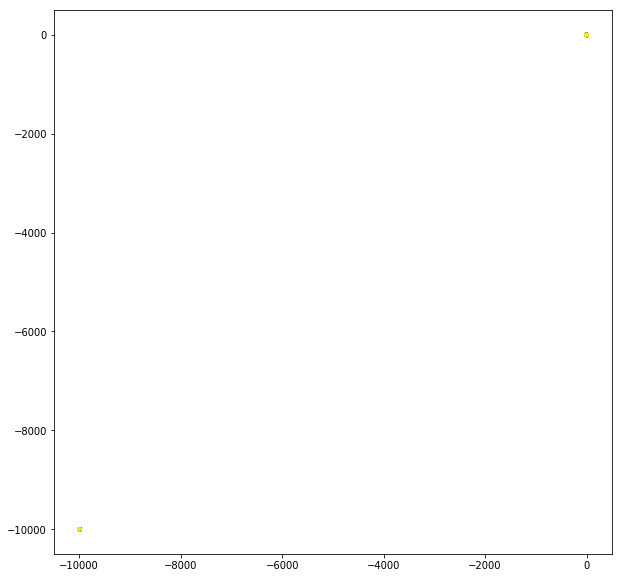

In [29]:
plt.figure(figsize=(10,10))
ax1 = plt.subplot(111)
P1 = ax1.scatter(AM1, FE_H1, s=10, c=RAD1)

In [25]:
minRadius = np.arange(0, 15, 2)
maxRadius = np.arange(2, 17, 2)
minZheights = [0.0, 0.5, 1.0]
maxZheights = [0.5, 1.0, 2.0]
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    index_cr = np.logical_and( cr > minr, cr <= maxr)
    index_radius = np.logical_and(radius > minr, radius <= maxr)

<Quantity [10.29042647,  8.28131729,  8.68104663, ...,  8.24695436,
            9.60949248,  8.40122624]>

0 2


198666

In [ ]:
plt.figure(figsize=(10,10))
zbincolors = ["blue", "green", "red"]
zbinnames = ["0<z<0.5", "0.5<z<1", "1<z<2"]
zcarbon_ratio = []
axc4 = plt.subplot(2,1,1)
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zrcut = np.logical_and(RAD[ccut] > minr, RAD[ccut] <= maxr)
    xyzhigh_carbon_index = (C >= avgc) & zrcut
    high_carbonxyz = np.sum(xyzhigh_carbon_index)
    xyzlow_carbon_index = (C < avgc) & zrcut
    low_carbonxyz = np.sum(xyzhigh_carbon_index)
    for i, (minz, maxz, cz, zname) in enumerate(zip(minZheights, maxZheights, zbincolors, zbinnames)):
        
        zcut = np.logical_and(np.abs(HEIGHT[ccut]) > minz, np.abs(HEIGHT[ccut]) <= maxz)
        zhigh_carbon_index = xyzhigh_carbon_index[zcut]
        zlow_carbon_index = xyzlow_carbon_index[zcut]
        high_carbonz = np.sum(zhigh_carbon_index)
        low_carbonz = np.sum(zlow_carbon_index)
        zratio_carbon = float(high_carbonz)/low_carbonz
        zcarbon_ratio.append(zratio_carbon)
print(zcarbon_ratio)
plt.plot(0.5*(minRadius + maxRadius), zcarbon_ratio[:8], c='b')
plt.plot(0.5*(minRadius + maxRadius), zcarbon_ratio[8:16], c='g')
plt.plot(0.5*(minRadius + maxRadius), zcarbon_ratio[16:25], c='r')
plt.legend(zbinnames)

czcarbon_ratio = []
axc5 = plt.subplot(2,1,2)
for i, (minr, maxr) in enumerate(zip(minRadius, maxRadius)):
    zcrcut = np.logical_and(CYLRAD[ccut] > minr, CYLRAD[ccut] <= maxr)
    high_carbon_indexcz = (C >= avgc) & zcrcut
    high_carboncz = np.sum(high_carbon_indexcz)
    low_carbon_indexcz = (C < avgc) & zcrcut
    low_carboncz = np.sum(high_carbon_indexcz)
    ratio_carbon = np.zeros()
    for j, (minz, maxz, cz, zname) in enumerate(zip(minZheights, maxZheights, zbincolors, zbinnames)):
        
        zcut = np.logical_and(np.abs(HEIGHT[ccut]) > minz, np.abs(HEIGHT[ccut]) <= maxz)
        czhigh_carbon_index = high_carbon_indexcz[zcut]
        czlow_carbon_index = low_carbon_indexcz[zcut]
        high_carbonz = np.sum(czhigh_carbon_index)
        low_carbonz = np.sum(czlow_carbon_index)
        ratio_carbon[j] = float(high_carbonz)/low_carbonz
        print(ratio_carbon[j])
        czcarbon_ratio.append(zcratio_carbon)
        print("The ratio between",minr,maxr,"radii and",minz,maxz,"height is:",ratio_carbon)
        plt.plot(0.5*(minRadius + maxRadius), ratio_carbon, c=cz)
plt.legend(zbinnames)
